# <p style="background-color:  #C0C0C0; font-family:newtimeroman;font-size:200%;color:darkviolet;text-align:center;border-radius:90px 20px;"><b>  Modelling Auto Scout Project  <img src="forbidden.png" style="width: 70x;" alt="Small Truck Icon" style="position: absolute; right: 5px; top: 60%; transform: translateY(-70%);"> </div> <p style="background-color:darkviolet;font-family:newtimeroman;font-size:200%;color:white;text-align:center;border-radius:20px 20px;"><b>Linear Regression Project </b></p>

## <font color='darkviolet'> <b>Determines </b><font color='black'>

- **Auto Scout** data was sourced in 2019 from the online automobile trading company [AutoScout24](https://www.autoscout24.com), encompassing a wide array of features across 9 different car models.

- This project will utilize a dataset that has been pre-processed and prepared for algorithms.

- The project's goal is to grasp machine learning algorithms. Hence, there's no need for an intensive EDA (Exploratory Data Analysis) process since you'll be working with organized data.

- We will employ regression algorithms to predict car prices in this scenario.

- Importing necessary libraries is a prerequisite before we commence. Additionally, a few pre-processing steps are required before we proceed to modeling.

- Sequentially, we will implement Linear Regression, Ridge Regression, Lasso Regression, and Elastic-Net algorithms.

- The success of our models can be gauged through regression error metrics and the cross-validation method.

- We will endeavor to enhance the performance of our models by tuning hyperparameters for better results.

- The significance of features for the model will be determined, and for resource efficiency, our model will be adjusted using the most crucial features.

- Lastly, the performance of the algorithms will be juxtaposed.

- Further efforts can be concentrated on the algorithm that exhibits the highest prediction accuracy.

**------------**

1. **make_model**: Contains the make and model information of the vehicles.
2. **body_type**: Indicates the body type of the vehicles (e.g., sedan, hatchback).
3. **price**: Contains the price information of the vehicles.
4. **vat**: Contains value-added tax (VAT) information (often important in vehicle sales).
5. **km**: Contains the mileage information of the vehicles.
6. **Type**: Indicates the type of the vehicle (e.g., new, used).
7. **Fuel**: Indicates the type of fuel used (e.g., petrol, diesel).
8. **Gears**: Contains the number of gears in the vehicles.
9. **Comfort_Convenience**: Contains the comfort and convenience features of the vehicles.
10. **Entertainment_Media**: Contains entertainment and media features.
11. **Extras**: Contains the extra features of the vehicles.
12. **Safety_Security**: Contains safety features.
13. **age**: The age of the vehicles.
14. **Previous_Owners**: Contains the number of previous owners of the vehicles.
15. **hp_kW**: Contains the horsepower of the vehicles in kilowatts.
16. **Inspection_new**: Contains information about whether the vehicle has a new inspection.
17. **Paint_Type**: Contains the type of paint of the vehicles.
18. **Upholstery_type**: Contains the type of upholstery in the vehicles.
19. **Gearing_Type**: Indicates the type of transmission in the vehicles.
20. **Displacement_cc**: Indicates the engine displacement in cubic centimeters (cc).
21. **Weight_kg**: Indicates the weight of the vehicles in kilograms.
22. **Drive_chain**: Indicates the type of drive train in the vehicles (e.g., front-wheel drive, rear-wheel drive).
23. **cons_comb**: Indicates the combined fuel consumption of the vehicles in liters per 100 kilometers.

## <font color='darkviolet'> <b>Tasks</b><font color='black'>

- 1. Import Modules, Load Data and Data Review

- 2. EDA

- 3. Train | Test Split

- 4. Implement Linear Regression

- 5. Implement Ridge Regression

- 6. Implement Lasso Regression

- 7. Implement Elastic-Net

- 8. Visually Compare Models Performance In a Graph

- 9. Feature Importance

- 10. Compare Models Performance

- 11. Prediction

 # <font color='lightblack'> <b>Import Modules, Load Data and Data Review</b><font color='black'> 

In [33]:
#!pip install pandas
#!pip install numpy

#!pip install matplotlib
#!pip install seaborn
#!pip install scikit-learn 
#!pip install sklearn
#pip install plotly


#!pip install missingno 
#!pip install summarytools
#!pip install ydata-profiling

#pip install inflection
#pip install skimpy

In [34]:
import pandas as pd      
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
 
import scipy.stats as stats
import inflection
from skimpy import clean_columns
import missingno as msno
import plotly.graph_objects as go
from scipy.stats import skew
    
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings('ignore')

plt.rcParams["figure.figsize"] = (10,6)   # default: (6.4, 4.8)
pd.set_option('display.max_columns', 500) # None: sınırsız, default:20
pd.set_option('display.max_rows', 500)    # None: sınırsız, default:10
pd.options.display.float_format = '{:.3f}'.format

<p style="background-color: #C0C0C0; font-family: newtimeroman; font-size: 250%; color: darkviolet; border-radius: 80px 20px; padding: 25px; text-align: center;"> <b>Data Preparation-EDA and Data Cleaning</b>
<img src="forbidden.png" style="width: 150px; vertical-align: left; margin-left: 20px; float:right;" alt="Small Truck Icon">
 <span style="display: inline-block; width: calc(80% - 20px); text-align: center;"></span> 
</p>



In [35]:
df0 = pd.read_csv("final_scout_not_dummy.csv")
df = df0.copy()

In [36]:
df.head()

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
0,Audi A1,Sedans,15770,VAT deductible,56013.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Catalytic Converter,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,2.000,66.000,1,Metallic,Cloth,Automatic,1422.000,1220.000,front,3.800
1,Audi A1,Sedans,14500,Price negotiable,80000.000,Used,Benzine,7.000,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Sport seats,Sport suspension,Voic...","ABS,Central door lock,Central door lock with r...",2.000,1.000,141.000,0,Metallic,Cloth,Automatic,1798.000,1255.000,front,5.600
2,Audi A1,Sedans,14640,VAT deductible,83450.000,Used,Diesel,7.000,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer","Alloy wheels,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,1.000,85.000,0,Metallic,Cloth,Automatic,1598.000,1135.000,front,3.800
3,Audi A1,Sedans,14500,VAT deductible,73000.000,Used,Diesel,6.000,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport seats,Voice Control","ABS,Alarm system,Central door lock with remote...",3.000,1.000,66.000,0,Metallic,Cloth,Automatic,1422.000,1195.000,front,3.800
4,Audi A1,Sedans,16790,VAT deductible,16200.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport package,Sport suspension,Vo...","ABS,Central door lock,Driver-side airbag,Elect...",3.000,1.000,66.000,1,Metallic,Cloth,Automatic,1422.000,1135.000,front,4.100


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   make_model           15915 non-null  object 
 1   body_type            15915 non-null  object 
 2   price                15915 non-null  int64  
 3   vat                  15915 non-null  object 
 4   km                   15915 non-null  float64
 5   Type                 15915 non-null  object 
 6   Fuel                 15915 non-null  object 
 7   Gears                15915 non-null  float64
 8   Comfort_Convenience  15915 non-null  object 
 9   Entertainment_Media  15915 non-null  object 
 10  Extras               15915 non-null  object 
 11  Safety_Security      15915 non-null  object 
 12  age                  15915 non-null  float64
 13  Previous_Owners      15915 non-null  float64
 14  hp_kW                15915 non-null  float64
 15  Inspection_new       15915 non-null 

In [38]:
df[df.duplicated(keep=False)].sort_values(by=list(df.columns))

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
336,Audi A1,Compact,14990,Price negotiable,49351.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,On-bo...","Alloy wheels,Sport seats,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,2.000,66.000,0,Metallic,Cloth,Automatic,1422.000,1180.000,front,4.000
337,Audi A1,Compact,14990,Price negotiable,49351.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,On-bo...","Alloy wheels,Sport seats,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,2.000,66.000,0,Metallic,Cloth,Automatic,1422.000,1180.000,front,4.000
339,Audi A1,Compact,14990,Price negotiable,49351.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,On-bo...","Alloy wheels,Sport seats,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,2.000,66.000,0,Metallic,Cloth,Automatic,1422.000,1180.000,front,4.000
340,Audi A1,Compact,14990,Price negotiable,49351.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,On-bo...","Alloy wheels,Sport seats,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,2.000,66.000,0,Metallic,Cloth,Automatic,1422.000,1180.000,front,4.000
341,Audi A1,Compact,14990,Price negotiable,49351.000,Used,Diesel,7.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,On-bo...","Alloy wheels,Sport seats,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.000,2.000,66.000,0,Metallic,Cloth,Automatic,1422.000,1180.000,front,4.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15819,Renault Espace,Van,50950,VAT deductible,11.000,New,Benzine,6.000,"Air conditioning,Armrest,Automatic climate con...","Digital radio,Radio","Alloy wheels,Voice Control","ABS,Daytime running lights,Driver-side airbag,...",0.000,1.000,165.000,0,Metallic,Cloth,Automatic,1798.000,1647.000,front,7.600
15820,Renault Espace,Van,52711,VAT deductible,11.000,New,Benzine,6.000,"Air conditioning,Armrest,Automatic climate con...","Digital radio,Radio","Alloy wheels,Voice Control","ABS,Daytime running lights,Driver-side airbag,...",0.000,1.000,165.000,0,Metallic,Part/Full Leather,Automatic,1798.000,1608.000,front,7.400
15823,Renault Espace,Van,52711,VAT deductible,11.000,New,Benzine,6.000,"Air conditioning,Armrest,Automatic climate con...","Digital radio,Radio","Alloy wheels,Voice Control","ABS,Daytime running lights,Driver-side airbag,...",0.000,1.000,165.000,0,Metallic,Part/Full Leather,Automatic,1798.000,1608.000,front,7.400
15808,Renault Espace,Van,54982,VAT deductible,11.000,New,Benzine,6.000,"Air conditioning,Armrest,Automatic climate con...","Digital radio,Radio","Alloy wheels,Voice Control","ABS,Daytime running lights,Driver-side airbag,...",0.000,1.000,165.000,0,Metallic,Part/Full Leather,Automatic,1798.000,1647.000,front,7.600


In [39]:
def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print("No more duplicate rows!")
    else:
        print("There are no duplicated observations in the dataset.")

In [40]:
duplicate_values(df)

Duplicate check...
There are 1673 duplicated observations in the dataset.
1673 duplicates were dropped!
No more duplicate rows!


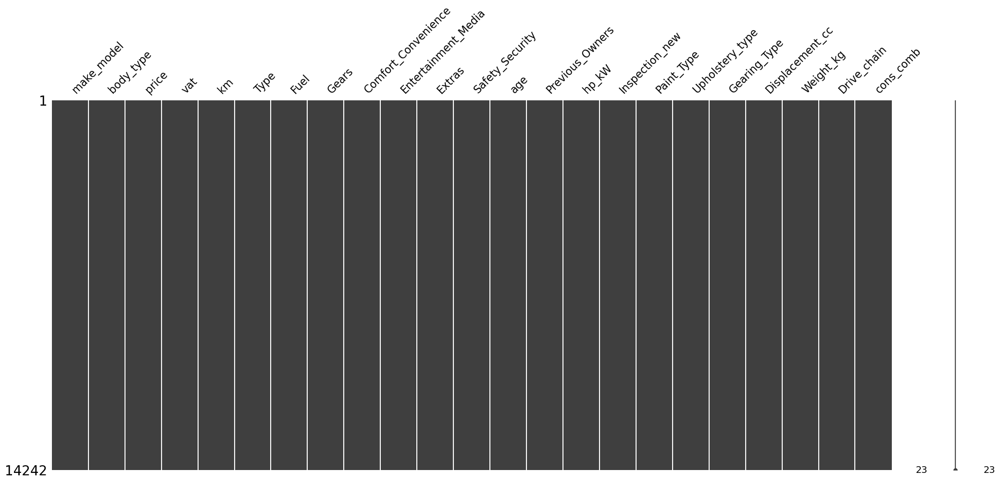

In [41]:
msno.matrix(df);

In [42]:
missing_count = df.isnull().sum()
value_count = df.isnull().count()
missing_percentage = round(missing_count / value_count * 100, 2)
missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
missing_df

,count,percentage
make_model,0,0.000
body_type,0,0.000
price,0,0.000
vat,0,0.000
km,0,0.000
Type,0,0.000
Fuel,0,0.000
Gears,0,0.000
Comfort_Convenience,0,0.000
Entertainment_Media,0,0.000


In [43]:
df.describe().T

#Understanding the Data
#If the standard deviation is greater than or close to the mean, it indicates that there is a general outlier problem in our data.
#If there is a significant gap between the "min" and the first quartile (25%) and/or between the third quartile (75%) and the "max", 
#it suggests that there may be a limited number of outlier values in our data, even if it is not a widespread issue.

,count,mean,std,min,25%,50%,75%,max
price,14242.000,18100.969,7421.214,4950.000,12950.000,16950.000,21900.000,74600.000
km,14242.000,32582.110,36856.863,0.000,3898.000,21000.000,47000.000,317000.000
Gears,14242.000,5.940,0.703,5.000,5.000,6.000,6.000,8.000
age,14242.000,1.415,1.110,0.000,0.000,1.000,2.000,3.000
Previous_Owners,14242.000,1.041,0.337,0.000,1.000,1.000,1.000,4.000
hp_kW,14242.000,88.713,26.548,40.000,66.000,85.000,103.000,294.000
Inspection_new,14242.000,0.256,0.437,0.000,0.000,0.000,1.000,1.000
Displacement_cc,14242.000,1432.890,277.507,890.000,1229.000,1461.000,1598.000,2967.000
Weight_kg,14242.000,1342.399,201.247,840.000,1165.000,1320.000,1487.000,2471.000
cons_comb,14242.000,4.825,0.862,3.000,4.100,4.800,5.400,9.100


In [44]:
df.describe(include="object").T

,count,unique,top,freq
make_model,14242,9,Audi A3,2758
body_type,14242,8,Sedans,7230
vat,14242,2,VAT deductible,13426
Type,14242,5,Used,10172
Fuel,14242,4,Benzine,7558
Comfort_Convenience,14242,6196,"Air conditioning,Electrical side mirrors,Hill ...",312
Entertainment_Media,14242,346,"Bluetooth,Hands-free equipment,On-board comput...",1562
Extras,14242,659,Alloy wheels,5010
Safety_Security,14242,4442,"ABS,Central door lock,Daytime running lights,D...",635
Paint_Type,14242,3,Metallic,13682


In [45]:
df.columns

Index(['make_model', 'body_type', 'price', 'vat', 'km', 'Type', 'Fuel',
       'Gears', 'Comfort_Convenience', 'Entertainment_Media', 'Extras',
       'Safety_Security', 'age', 'Previous_Owners', 'hp_kW', 'Inspection_new',
       'Paint_Type', 'Upholstery_type', 'Gearing_Type', 'Displacement_cc',
       'Weight_kg', 'Drive_chain', 'cons_comb'],
      dtype='object')

In [46]:
from summarytools import dfSummary
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,make_model[object],1. Audi A32. Opel Insignia3. Audi A14. Opel Astra5. Opel Corsa6. Renault Clio7. Renault Espace8. Renault Duster9. Audi A2,"2,758 (19.4%)2,417 (17.0%)2,377 (16.7%)2,305 (16.2%)1,994 (14.0%)1,486 (10.4%)884 (6.2%)20 (0.1%)1 (0.0%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAADPCAYAAADifqNtAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAADXklEQVR4nO3cu20baRiG0W8EwpeEhCBAJdg9qAgXu0WwiO1BEDTB+pLQgeHAhgMKFB8uzHMaGAYP/sEM5uVyOBwGCjeX/gFcD7GRERsZsZERGxmxkREbmWVm3s/Mmwtc+9vhcPh8getyIZu7u7tP2+32tr7wuq5Py7L8I7jrsdlut7cPDw+fd7vdl+qiz8/P7/b7/e3j4+ObmRHbldjMzOx2uy/39/f/xdd+H1+PC/OAQEZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERmYz8+OTn/Ki9fX4f9is6/q03+9vJ/7kZ13Xp5n5Vl6Ty/JZOJnFf31QKU82J9mVywYvBi4kgxcDF2bawYuBy5XzUpeM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI1MMngxcGEmHLwYuOCzcDIGL2Q8IJBxGyVjXUXGuoqMdRUZDwhkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkrKvIWFeR8Vk4GesqMtXJ5lSjGbwYuzATDF6MXfipGrwYu+ClLh2xkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERG5mzD16MXfgpGbwYuzDjs3BCBi9kznmyOc34xdkGL0Yu/O4sgxcjF/7knIMXIxd+4aUuGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGROcu6yqKKPznbusqiit/ZIJCxriLzGiebE4yjnLyusqLiWCetq6yoeInXWFdZUXEUL3XJiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjInDR4MWzhJU4evBi2cCyfhZMxeCHzkpPNCcZJjh68GLZwqqMGL4YtvIaXDF4MWziJl7pkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEbmqHWVFRWv4eh1lRUVp7JBIGNdRcYDApmbZVk+LsviAYCzu5mZDzPz9tI/hL+f2ygZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERG5mbmfl3Zr5e+ofw97NBIOM2SkZsZAxeyBi8kHEbJSM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYy1lVkrKvIuI2SERsZsZERGxmxkREbGbGR+Q6zioPTpm6vDQAAAABJRU5ErkJggg=="">",0(0.0%)
2,body_type[object],1. Sedans2. Station wagon3. Compact4. Van5. Transporter6. Off-Road7. Coupe8. Convertible,"7,230 (50.8%)3,405 (23.9%)2,710 (19.0%)735 (5.2%)87 (0.6%)42 (0.3%)25 (0.2%)8 (0.1%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAC4CAYAAAD0WZ4UAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAADLElEQVR4nO3dwW0bVwBF0T8E4cQbEgQBlZD0oCJcbIpgEe5BEDQL2/GGWcTZ2hJC3RmS51TwIVzwa4h50nQ+nwcUNksfgPshNjJiIyM2MmIjIzYy0xjj4xjjw9IHuVLfz+fz16UPcS22x+Px0263Oyx9kGs0z/PzNE1/Ce51trvd7vD4+Ph1v99/W/ow1+Tl5eX30+l0eHp6+jDGENsrbMcYY7/ff3t4ePiy9GGu0MelD3BNPCCQERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGR2Y7x7+sySx/k2viZvd12nufn0+l0GF6XebN5np/HGN+XPse18Fr4/+O18DeY/PkFKmv9ZPOJcYNWOXgxJLlNqxu8GJLcrrUOXjwZ3yBf6pIRGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZFZ3eBlTWfhslY5eDEkuU1eCydj8ELGAwKZpa5R1+QdWmRdZT11n/J1lfXU/VpqXbWar1noeEAgIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjk6+rrKfu1yLrKuup++S1cDLWVWRe88nmU4iL+OXgxTiFS/np4MU4hUt6zeDFOIWL8KUuGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbmZ8OXoxTuKRfDl6MU7gUr4WTMXgh4wGBzH/X6HBV8t62x+Px0xhjWFDx3ja73e7wY8q3tv85yo3xOxsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERG5ntj/XUGBZUvDOvhZOxriLjdzYym2ma/pymyZ9Z4N1txhh/jDF+W/og3D7XKBmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGR2YwxPo8x/l76INw+gxcyrlEyYiNjXUXGuoqMa5SM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzBCxmDFzKuUTJiI2PwQsbghYxrlIzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIWFeRsa4i4xolIzYyYiMjNjJiIyM2Mv8AgWf+Z/jmsfEAAAAASUVORK5CYII="">",0(0.0%)
3,price[int64],Mean (sd) : 18101.0 (7421.2)min < med < max:4950.0 < 16950.0 < 74600.0IQR (CV) : 8950.0 (2.4),"2,952 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACcUlEQVR4nO3dvY7aQBSG4TOwIPMTI4QEHU3KSCkouYhcbNp0KbiCbVPRICQERjjrYIxTUWWzCzYO8znv049x8Qp2FubY5XlugO8aj74B4BpPVV7cOdcxs3aJSxzzPH+51/1AV2WhOuc6o9HoSxiGw6LX2O/3W+fcV2JFle+o7TAMh/P5/GUwGCS3Lo6iKFgsFsPNZtM2M0L9z1X60W9mNhgMkvF4/LPg8s5dbway2ExBAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCQuW/8C8jy7KWmYXOuSLLORhYI96GGsdxK03Tz9PptNlsNm8+c8XBwHrxNtTj8fgUBEF3Npslk8lke8taDgbWj7ehXvR6vaKHAzkYWCNspiCBUCGBUCGBUCGBUCGBU

In [47]:
from ydata_profiling import ProfileReport

In [48]:
pr_df = ProfileReport(df)
pr_df

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# <font color='lightblack'> <b>Feature Engineering</b><font color='black'> 

In [49]:
df.select_dtypes(include ="object").head()

,make_model,body_type,vat,Type,Fuel,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,Paint_Type,Upholstery_type,Gearing_Type,Drive_chain
0,Audi A1,Sedans,VAT deductible,Used,Diesel,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Catalytic Converter,Voice Control","ABS,Central door lock,Daytime running lights,D...",Metallic,Cloth,Automatic,front
1,Audi A1,Sedans,Price negotiable,Used,Benzine,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Sport seats,Sport suspension,Voic...","ABS,Central door lock,Central door lock with r...",Metallic,Cloth,Automatic,front
2,Audi A1,Sedans,VAT deductible,Used,Diesel,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer","Alloy wheels,Voice Control","ABS,Central door lock,Daytime running lights,D...",Metallic,Cloth,Automatic,front
3,Audi A1,Sedans,VAT deductible,Used,Diesel,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport seats,Voice Control","ABS,Alarm system,Central door lock with remote...",Metallic,Cloth,Automatic,front
4,Audi A1,Sedans,VAT deductible,Used,Diesel,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport package,Sport suspension,Vo...","ABS,Central door lock,Driver-side airbag,Elect...",Metallic,Cloth,Automatic,front


## Dummies control ?

In [50]:
for column in df.columns:
    unique_values = df[column].unique()
    unique_count = len(unique_values)
# Note: For columns with a large number of unique values, printing all values might not be practical.
    # Therefore, if there are more than 10 unique values, only the first 10 are displayed.
   
    print(f"\033[1m\033[91mColumn:\033[0m \033[1m\033[94m{column}\033[0m")
    print(f"\033[1m\033[92mNumber of Unique Values:\033[93m {unique_count}")
    
    if unique_count <= 10:
        print(f"\033[1mUnique Values:\033[0m {unique_values}\n")
    else:
        print(f"\033[95mFirst 10 Unique Values:\033[0m {unique_values[:10]}")
        print(f"... and {unique_count - 10} more unique values\n")

Column: make_model
Number of Unique Values: 9
Unique Values: ['Audi A1' 'Audi A2' 'Audi A3' 'Opel Astra' 'Opel Corsa' 'Opel Insignia'
 'Renault Clio' 'Renault Duster' 'Renault Espace']

Column: body_type
Number of Unique Values: 8
Unique Values: ['Sedans' 'Station wagon' 'Compact' 'Coupe' 'Van' 'Off-Road' 'Convertible'
 'Transporter']

Column: price
Number of Unique Values: 2952
First 10 Unique Values: [15770 14500 14640 16790 15090 16422 14480 16700 17990 18500]
... and 2942 more unique values

Column: vat
Number of Unique Values: 2
Unique Values: ['VAT deductible' 'Price negotiable']

Column: km
Number of Unique Values: 6691
First 10 Unique Values: [56013. 80000. 83450. 73000. 16200. 63668. 62111. 14986. 57000. 16103.]
... and 6681 more unique values

Column: Type
Number of Unique Values: 5
Unique Values: ['Used' "Employee's car" 'New' 'Demonstration' 'Pre-registered']

Column: Fuel
Number of Unique Values: 4
Unique Values: ['Diesel' 'Benzine' 'LPG/CNG' 'Electric']

Column: Gears
Num

In [51]:
for col in df.select_dtypes('object'):
    print(f"{col:<20}:", df[col].nunique())
    
# <20 ile en soldan ":" işaretine kadar 20 karakterlik boşluk bırakılır ve feature isimleri bu boşluğa yazdırılır.
# ":" işareti tüm satırlarda aynı hizaya getirilmiş olur.

make_model          : 9
body_type           : 8
vat                 : 2
Type                : 5
Fuel                : 4
Comfort_Convenience : 6196
Entertainment_Media : 346
Extras              : 659
Safety_Security     : 4442
Paint_Type          : 3
Upholstery_type     : 2
Gearing_Type        : 3
Drive_chain         : 3


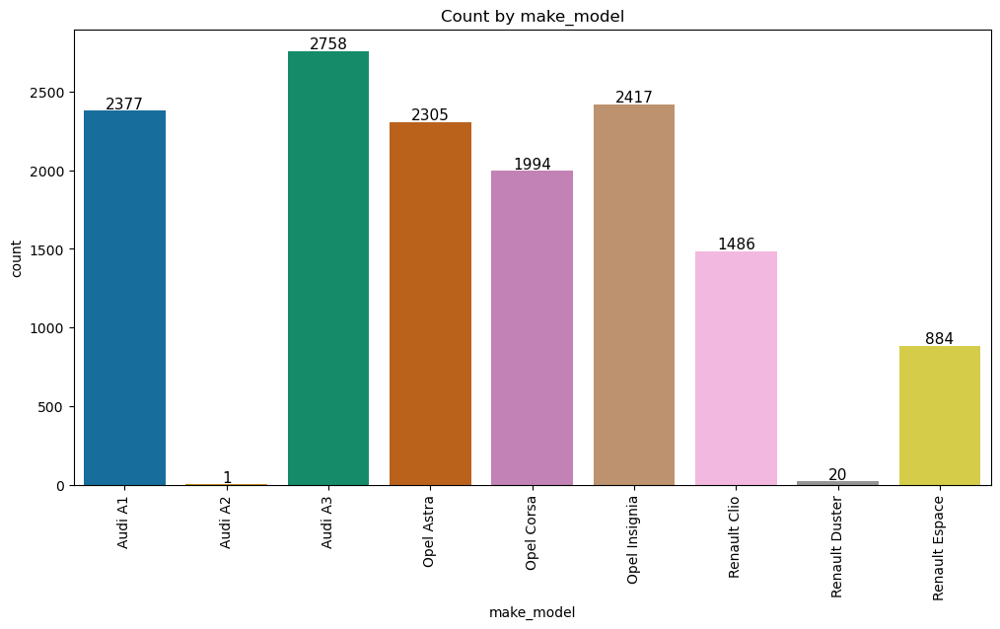

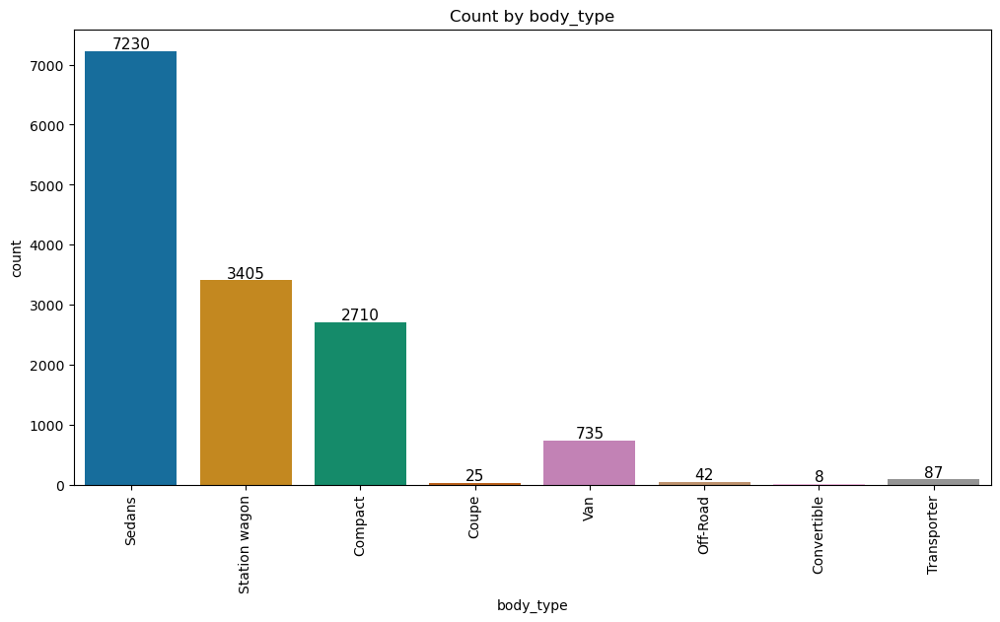

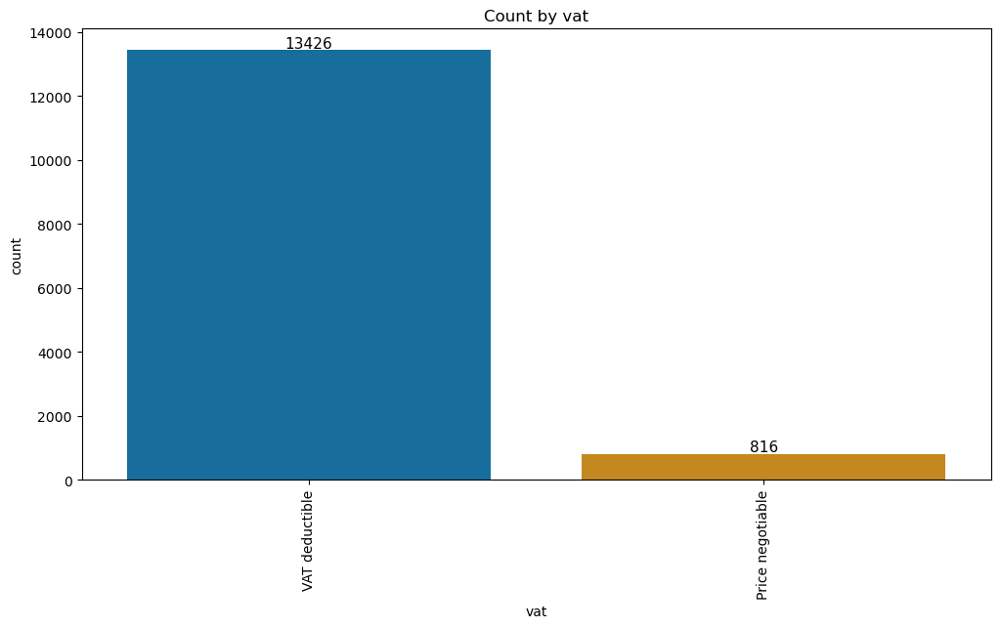

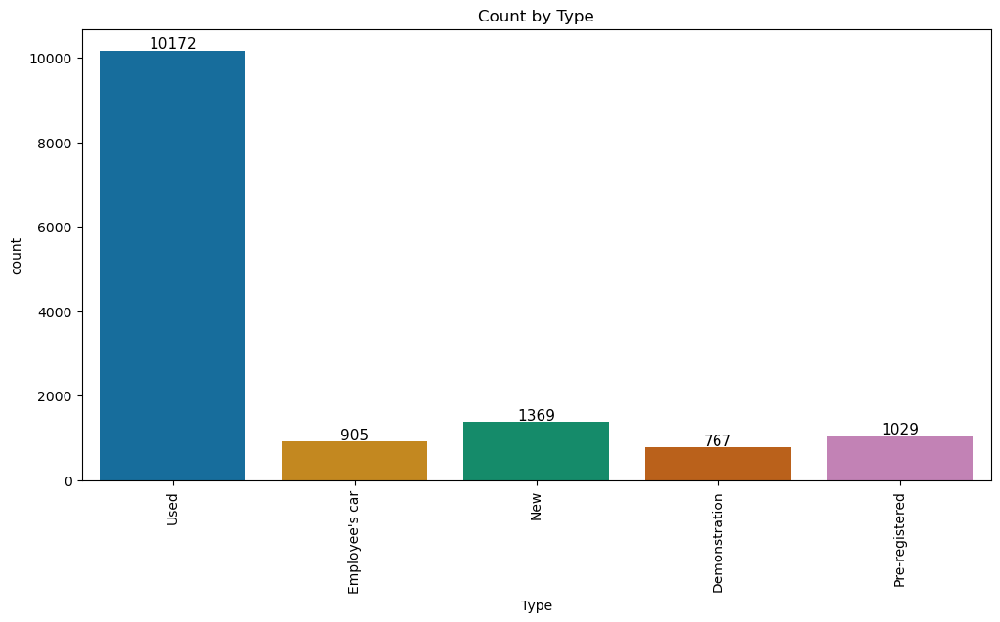

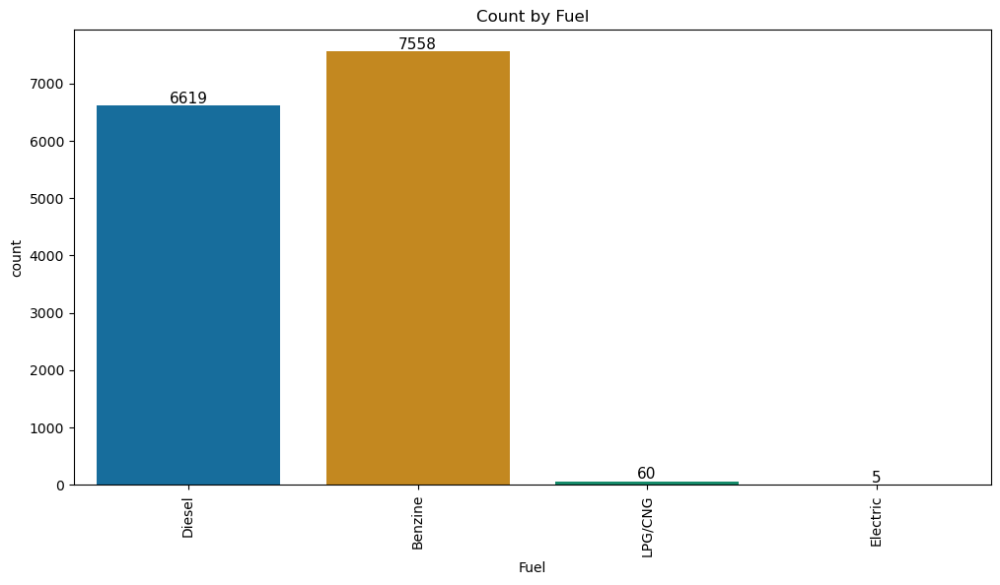

...

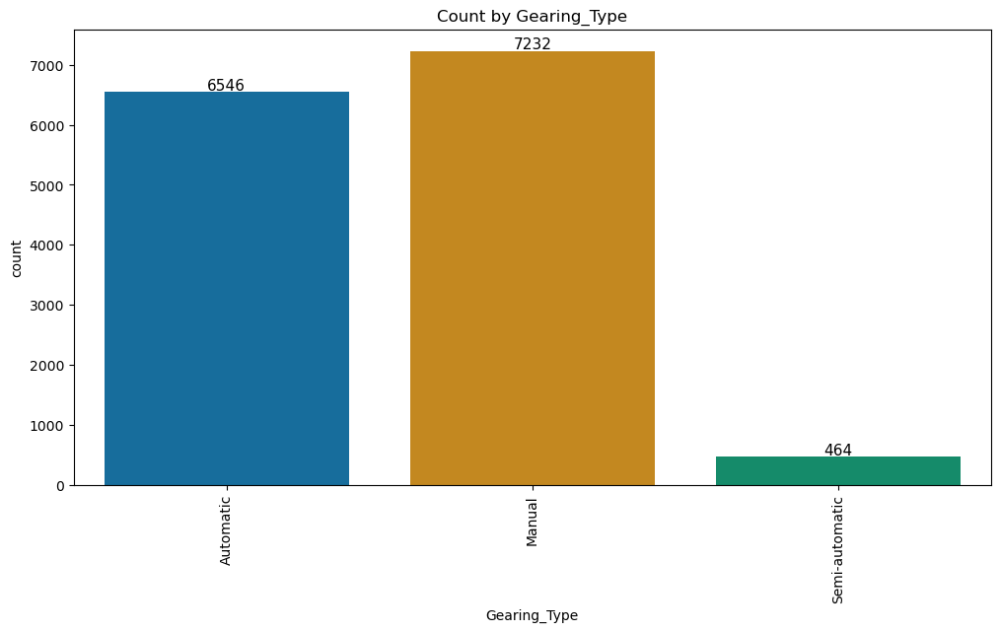

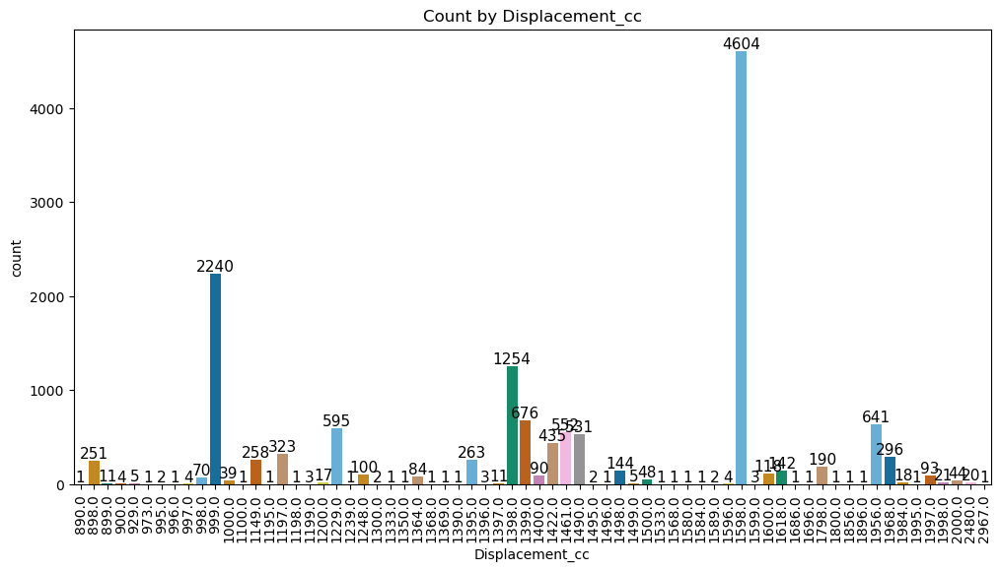

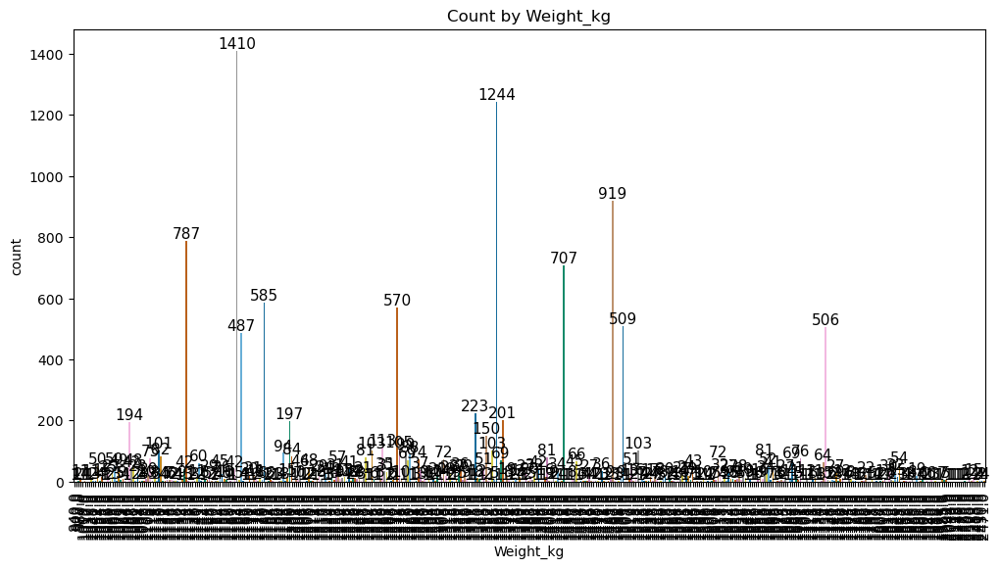

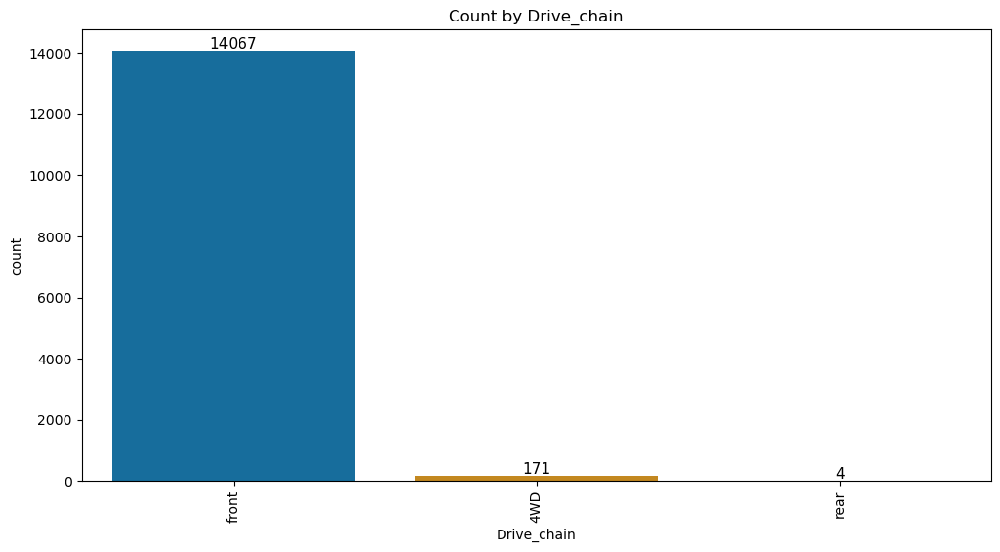

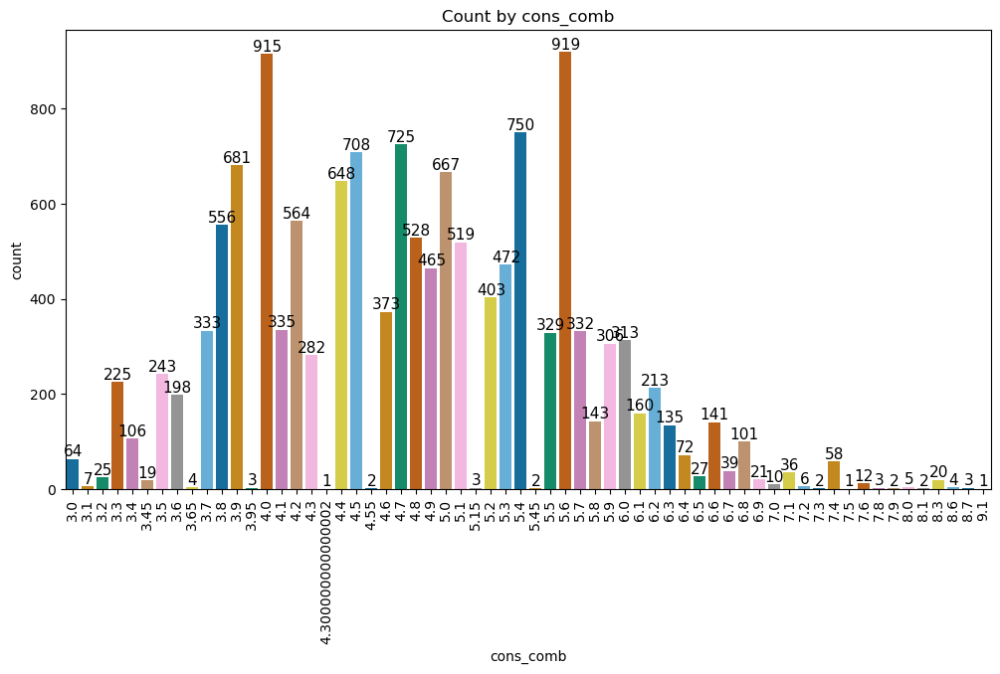

In [52]:
max_unique_values = 500

for col in df.columns:
    if col in df and df[col].nunique() <= max_unique_values:
        plt.figure(figsize=(12, 6))
        ax = sns.countplot(x=col, data= df, palette="colorblind")
        
        plt.title(f"Count by {col}")
        plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
        
        # Adding counts above each bar
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                        textcoords='offset points')
        
        plt.show()

In [53]:
df.make_model.value_counts()

make_model
Audi A3           2758
Opel Insignia     2417
Audi A1           2377
Opel Astra        2305
Opel Corsa        1994
Renault Clio      1486
Renault Espace     884
Renault Duster      20
Audi A2              1
Name: count, dtype: int64

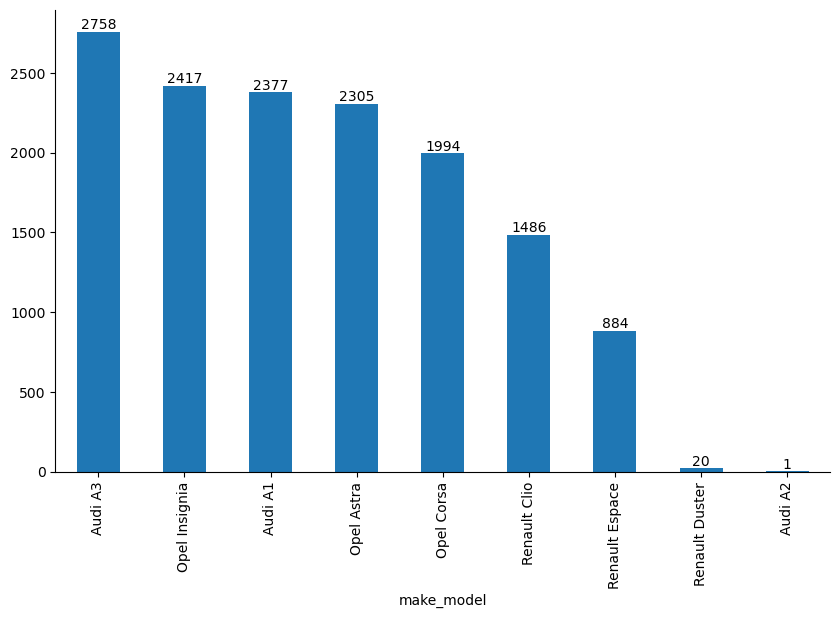

In [54]:
ax = df.make_model.value_counts().plot(kind ="bar")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.axis("off")
    
ax.bar_label(ax.containers[0]);

# for p in ax.patches:
#     ax.annotate(str(p.get_height()), (p.get_x() * 1.03, p.get_height() * 1.03))

In [55]:
df[df.make_model=="Audi A2"]

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
2614,Audi A2,Off-Road,28200,VAT deductible,26166.000,Employee's car,Diesel,6.000,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...",Alloy wheels,"ABS,Adaptive Cruise Control,Central door lock,...",1.000,1.000,85.000,0,Metallic,Cloth,Manual,1598.000,1135.000,front,4.900


In [56]:
df.drop(index=[2614], inplace =True)

In [57]:
df.shape

(14241, 23)

In [58]:
numeric_cols = df.select_dtypes(include=['number']).columns

for col_name in numeric_cols:
    
    column_skewness = skew(df[col_name].dropna())
    print(f"{col_name}: {column_skewness}")

price: 1.268654389014756
km: 1.6512957906438446
Gears: 0.33090007535058663
age: 0.16010107322088987
Previous_Owners: 1.1033770930471951
hp_kW: 1.3295084037365725
Inspection_new: 1.1163673546520767
Displacement_cc: -0.0756542745379683
Weight_kg: 1.0686412461931392
cons_comb: 0.45754298973582824


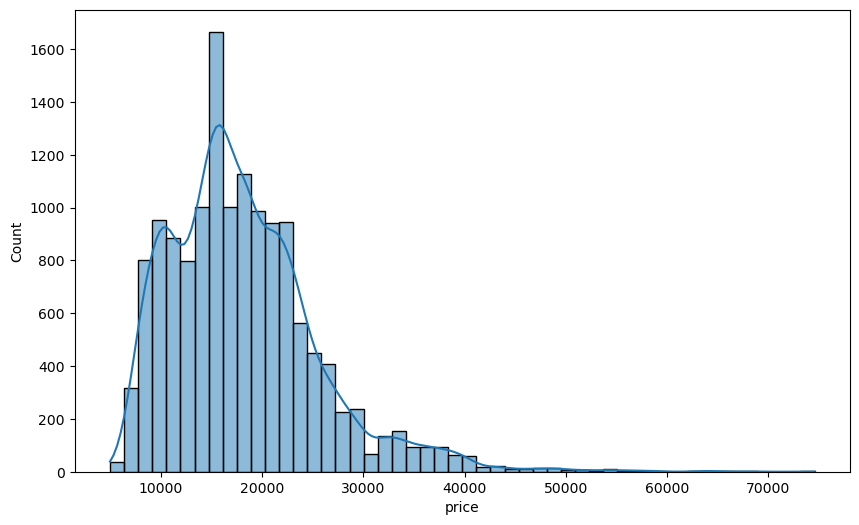

In [59]:
#Identifying Outliers with Histplot
#Since linear models are highly sensitive to outliers, I am trying to detect outliers in the data using a histplot.
#It's important to remember that for Machine Learning, outliers mean that the data belonging to one or more groups may be insufficient for training. 
#Looking at the following visualization, we can see that the number of cars priced above 40,000 EURO is very low. From this visual insight,
#we can infer that cars priced above 40,000 EURO might be insufficient in numbers for training purposes. However, 
#we cannot determine their sufficiency or insufficiency without conducting the training. 
#We should decide by conducting training sessions both with and without dropping what we consider as outliers and then comparing the scores.

#Additionally, looking at a histplot for the entire dataset may mislead us regarding outliers. For accurate outlier detection,
#we should group the data (e.g., Audi A3, Audi A1, Renault Clio, etc.) and then perform outlier detection accordingly.
sns.histplot(df.price, bins=50, kde=True);

In [60]:
df_numeric = df.select_dtypes(include ="number")
df_numeric


,price,km,Gears,age,Previous_Owners,hp_kW,Inspection_new,Displacement_cc,Weight_kg,cons_comb
0,15770,56013.000,7.000,3.000,2.000,66.000,1,1422.000,1220.000,3.800
1,14500,80000.000,7.000,2.000,1.000,141.000,0,1798.000,1255.000,5.600
2,14640,83450.000,7.000,3.000,1.000,85.000,0,1598.000,1135.000,3.800
3,14500,73000.000,6.000,3.000,1.000,66.000,0,1422.000,1195.000,3.800
4,16790,16200.000,7.000,3.000,1.000,66.000,1,1422.000,1135.000,4.100
...,...,...,...,...,...,...,...,...,...,...
15907,39980,100.000,6.000,0.000,1.000,118.000,0,1598.000,1734.000,4.700
15908,39950,1647.363,6.000,0.000,1.000,147.000,0,1997.000,1758.000,5.300
15909,39950,1000.000,6.000,0.000,1.000,165.000,0,1798.000,1734.000,6.800
15911,39885,9900.000,7.000,0.000,1.000,165.000,0,1798.000,1708.000,7.400


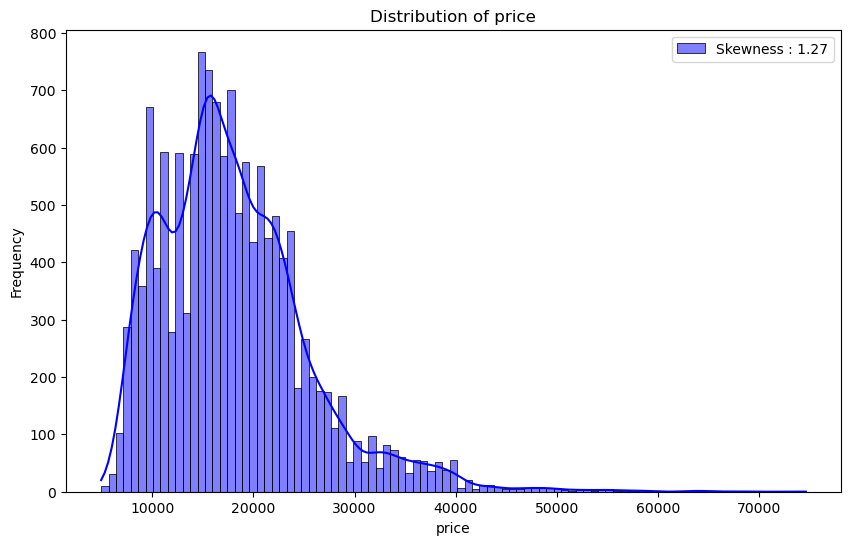

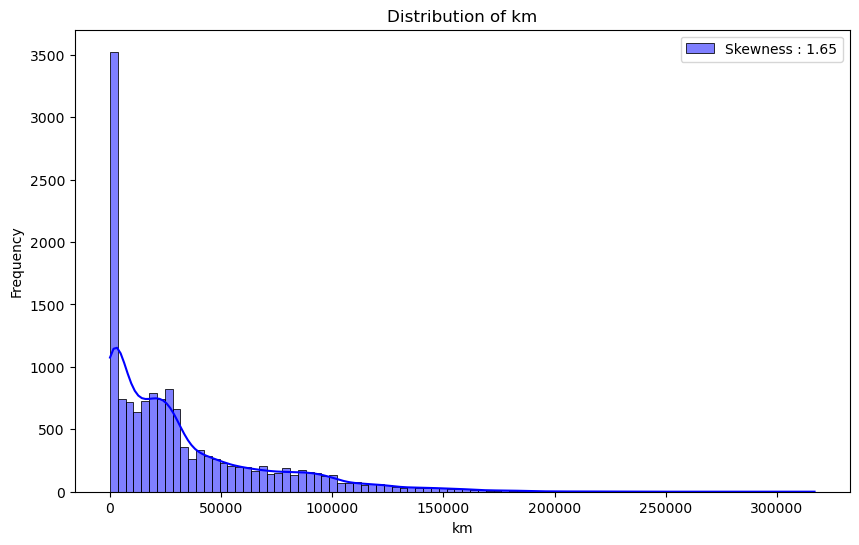

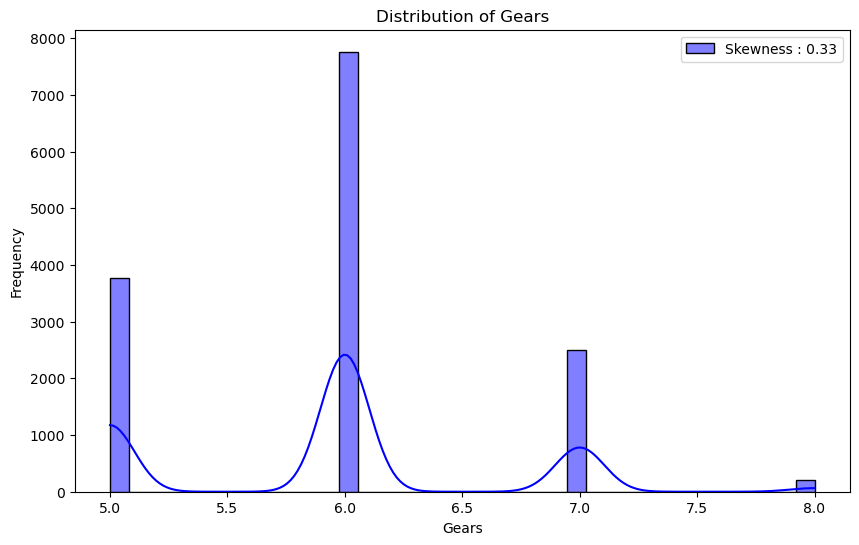

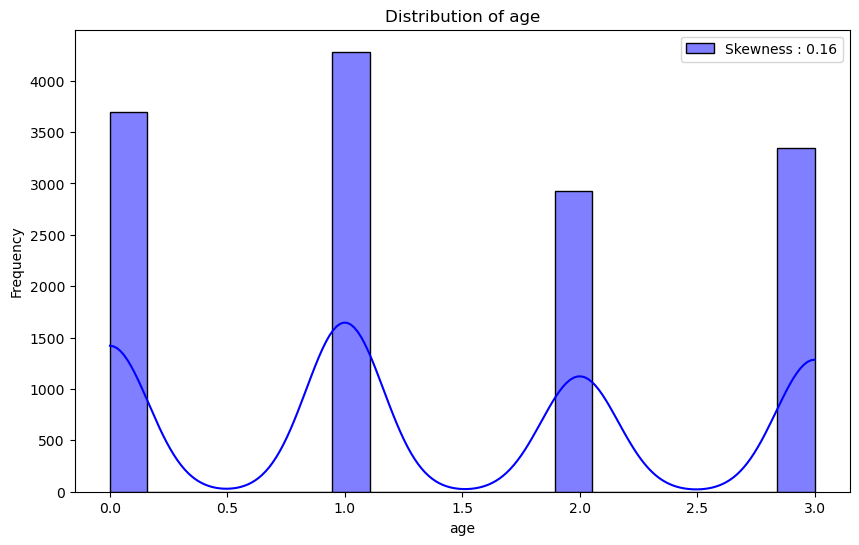

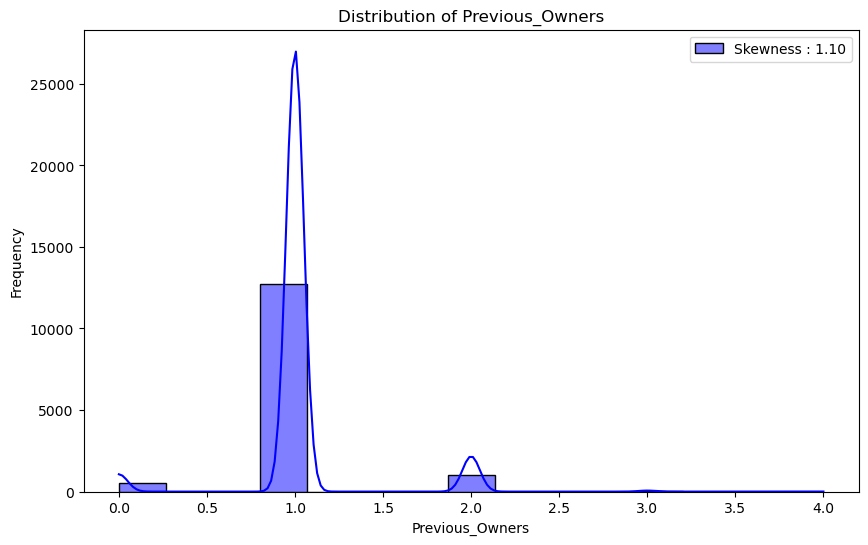

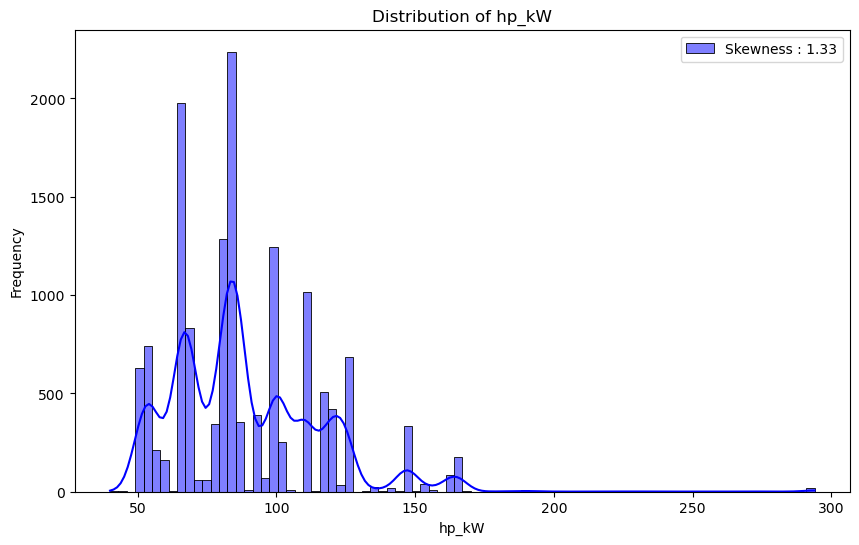

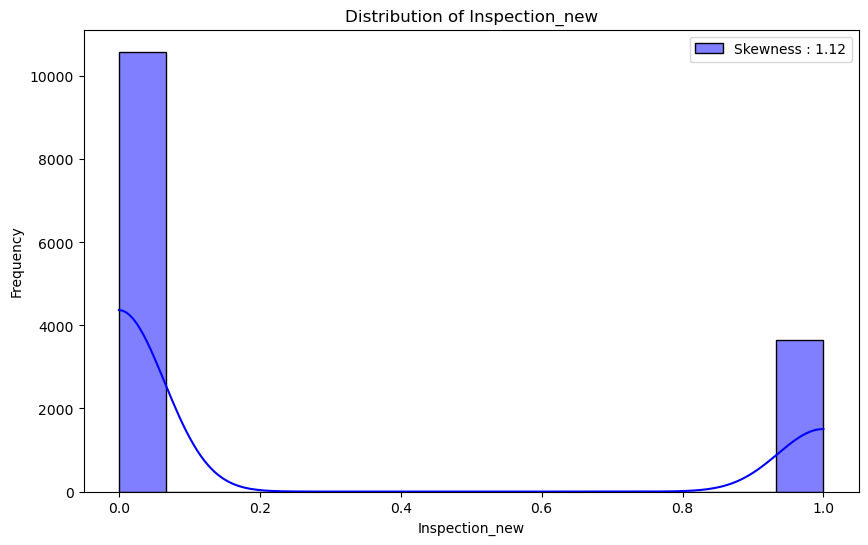

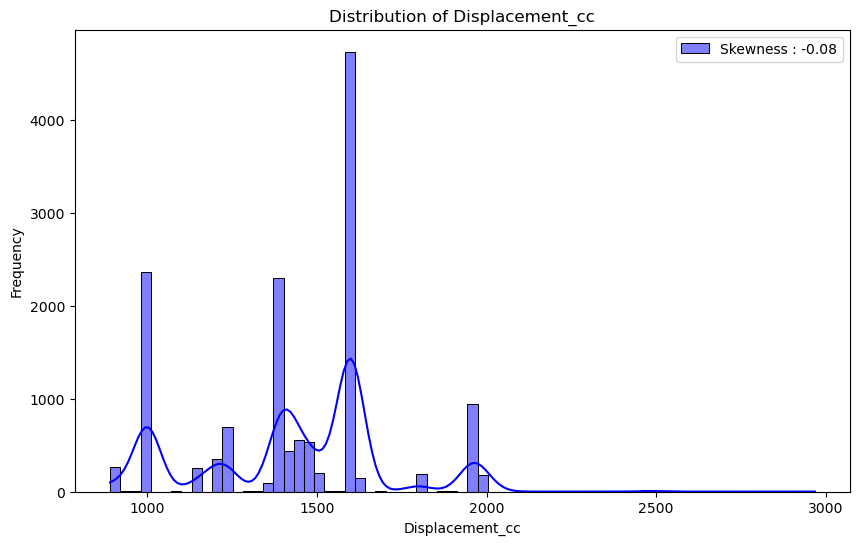

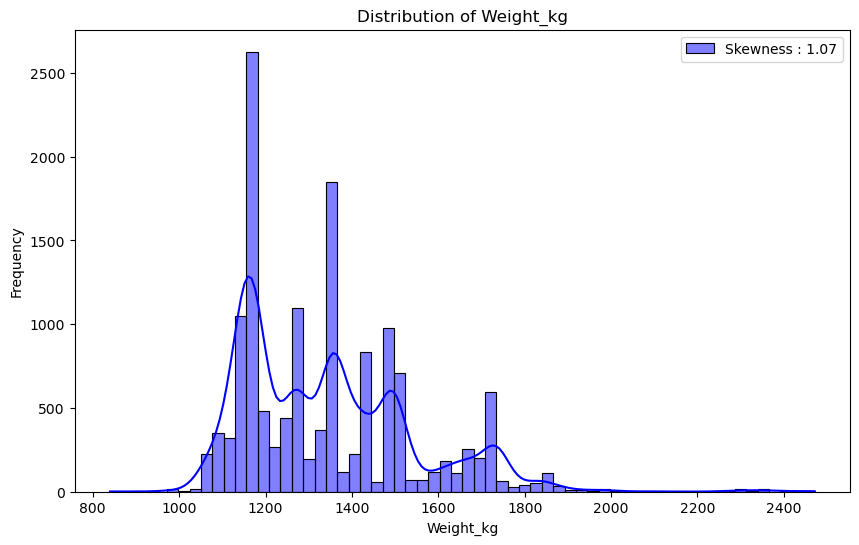

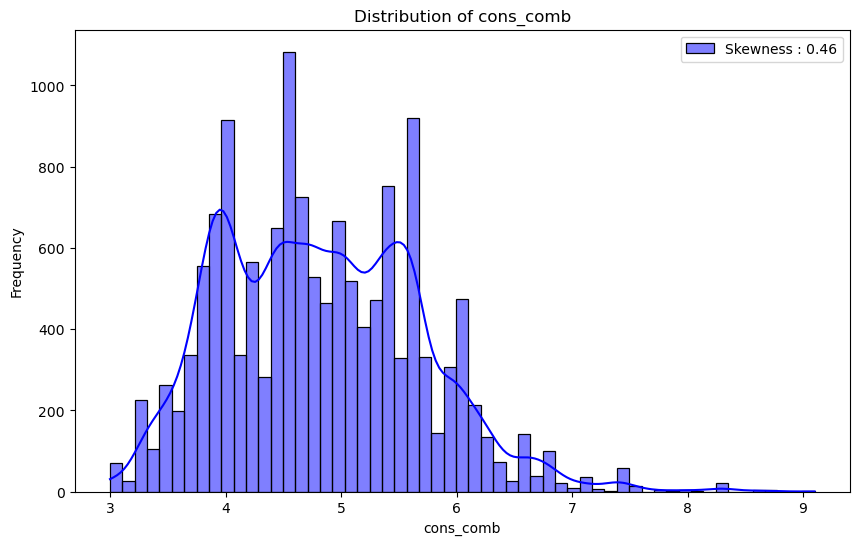

In [61]:
numeric_cols = df.select_dtypes(include=['number']).columns

for col in numeric_cols:
     
    g = sns.histplot(df[col], color="b", kde=True, label=f"Skewness : {df[col].skew():.2f}")
    
    plt.legend(loc="best")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [62]:
def color_correlation1(val):
    """
    Takes a scalar and returns a string with
    the css property in a variety of color scales 
    for different correlations.
    """
    if val >= 0.6 and val < 0.99999 or val <= -0.6 and val > -0.99999:
        color = 'red'
    elif val < 0.6 and val >= 0.3 or val > -0.6 and val <= -0.3:
        color = 'blue'
    elif val == 1:
        color = 'green'    
    else:
        color = 'black'
    return 'color: %s' % color


df_numeric.corr().style.applymap(color_correlation1)


,price,km,Gears,age,Previous_Owners,hp_kW,Inspection_new,Displacement_cc,Weight_kg,cons_comb
price,1.000000,-0.402383,0.528127,-0.481424,-0.148628,0.698043,0.002771,0.287021,0.460265,0.273561
km,-0.402383,1.000000,-0.038145,0.748734,0.158775,0.013365,-0.036472,0.305740,0.152797,-0.295296
Gears,0.528127,-0.038145,1.000000,-0.079296,-0.036679,0.451228,-0.006482,0.337764,0.332289,0.006956
age,-0.481424,0.748734,-0.079296,1.000000,0.314147,-0.092952,-0.023629,0.197629,0.061158,-0.339086
Previous_Owners,-0.148628,0.158775,-0.036679,0.314147,1.000000,-0.031628,0.037223,0.030033,0.003690,-0.033281
hp_kW,0.698043,0.013365,0.451228,-0.092952,-0.031628,1.000000,0.044698,0.605772,0.641306,0.391021
Inspection_new,0.002771,-0.036472,-0.006482,-0.023629,0.037223,0.044698,1.000000,-0.023916,-0.040937,0.141964
Displacement_cc,0.287021,0.305740,0.337764,0.197629,0.030033,0.605772,-0.023916,1.000000,0.566900,0.055187
Weight_kg,0.460265,0.152797,0.332289,0.061158,0.003690,0.641306,-0.040937,0.566900,1.000000,0.088582
cons_comb,0.273561,-0.295296,0.006956,-0.339086,-0.033281,0.391021,0.141964,0.055187,0.088582,1.000000


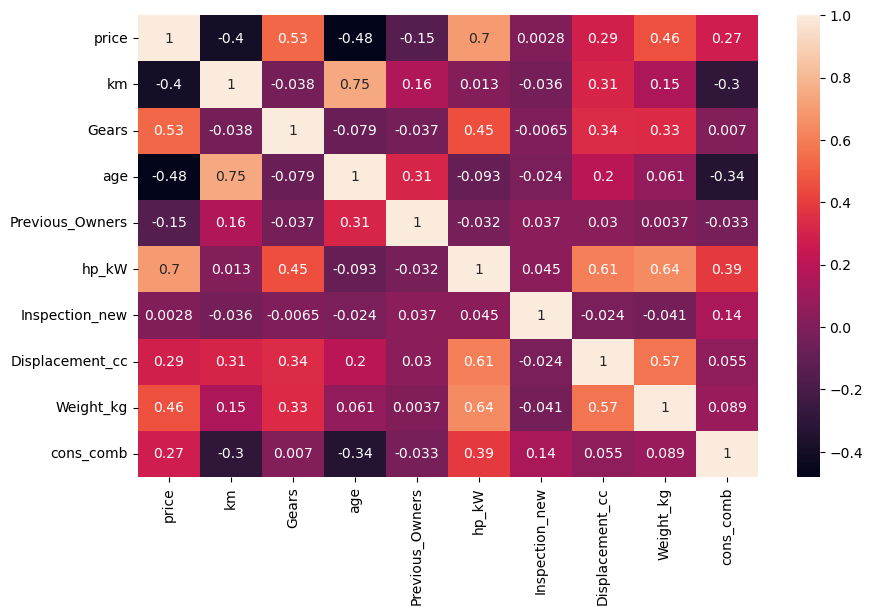

In [63]:
sns.heatmap(df_numeric.corr(), annot =True);

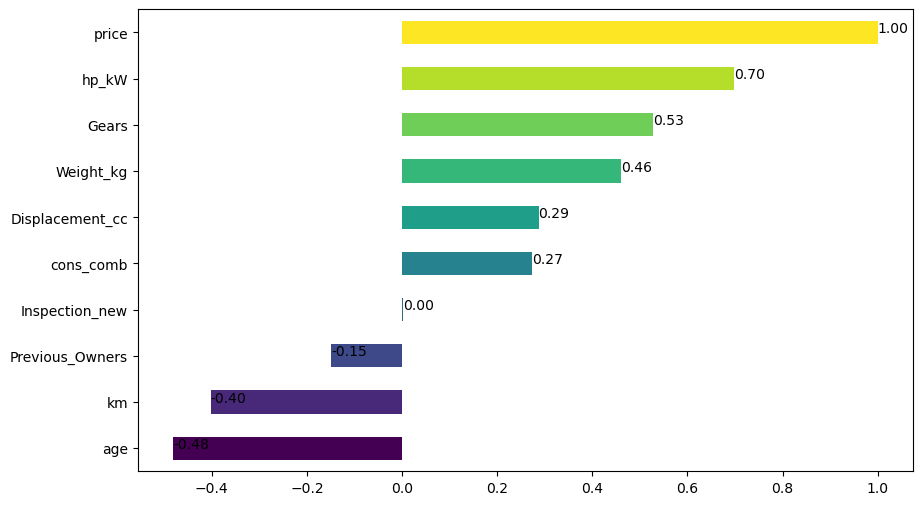

In [66]:
corr_values = df_numeric.corr()["price"].sort_values()
colors = plt.cm.viridis(np.linspace(0, 1, len(corr_values)))

ax = corr_values.plot.barh(color=colors)
for index, value in enumerate(corr_values):
    plt.text(value, index, "{:.2f}".format(value))

plt.show()

In [67]:
# Assuming df_filtered is your DataFrame after dropping "CO2 Emissions(g/km)"
numeric_cols = df.select_dtypes(include=['number']).columns

for col in numeric_cols:
    # Step 1: Binning the data with qcut and ensuring no duplicate bins
    df[f"{col}_bin"] = pd.qcut(df[col], q=4, duplicates='drop')
    
    # Convert Interval objects to strings for Plotly compatibility
    df[f"{col}_bin_str"] = df[f"{col}_bin"].astype(str)
    
    # Step 2: Calculating proportions
    bin_counts = df[f"{col}_bin_str"].value_counts(normalize=True)
    
    # Step 3: Plotting with Plotly
    fig = go.Figure(data=[go.Pie(labels=bin_counts.index, values=bin_counts.values, title=f"Distribution of {col}")])
    
    fig.update_traces(textposition='inside', textinfo='percent+label')
    fig.show()

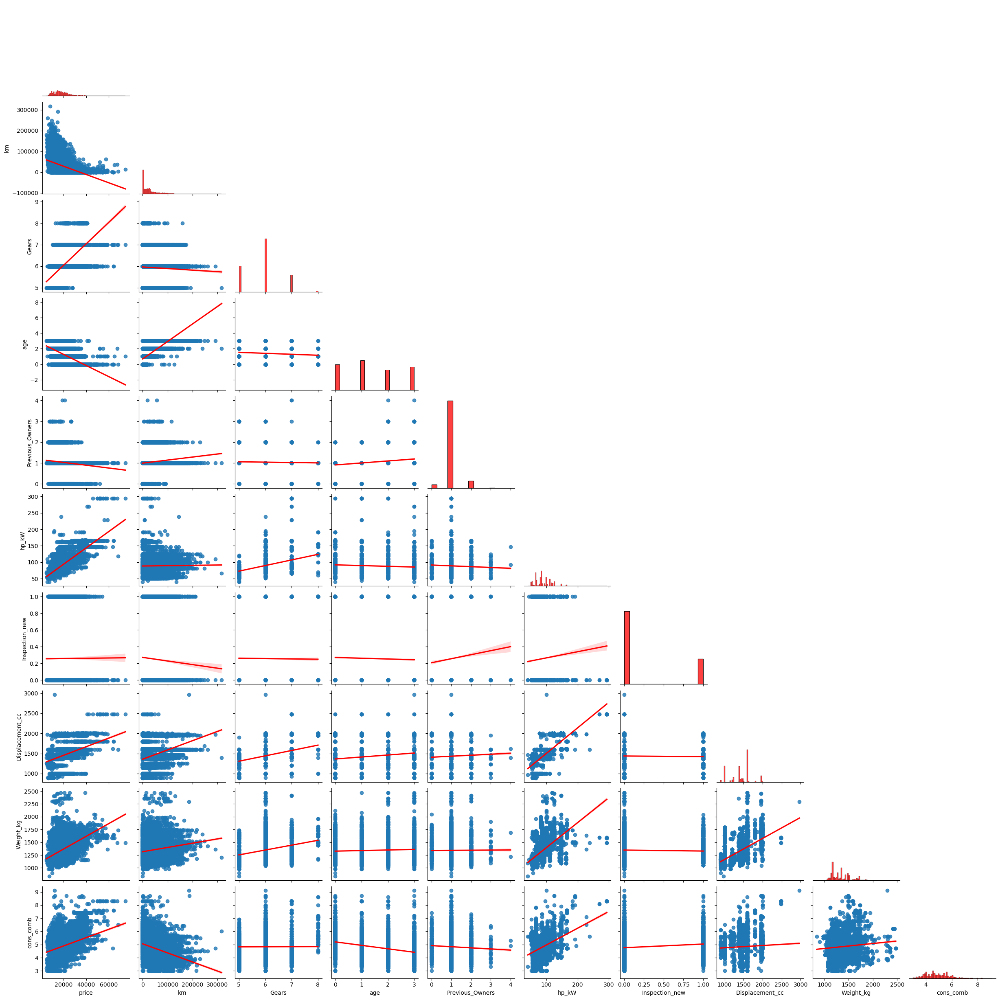

In [68]:
sns.pairplot(df, kind = "reg", diag_kind = "hist", diag_kws={"color":"red"}, plot_kws={"line_kws":{"color":"red"}},
             corner=True)

plt.show()

## Multicollinearity control

In [69]:
df_numeric.corr()[(df_numeric.corr()>= 0.9) & (df_numeric.corr() < 1)].any().any()

# +0.9 ile +1 arasındaki corr. değerleri için multicollinearity kontrolünü bu kod ile yapabiliriz.

False

In [70]:
df_numeric.corr()[(df_numeric.corr()<= -0.9) & (df_numeric.corr() > -1)].any().any()

# -0.9 ile -1 arasındaki corr. değerleri için multicollinearity kontrolünü bu kod ile yapabiliriz.

False

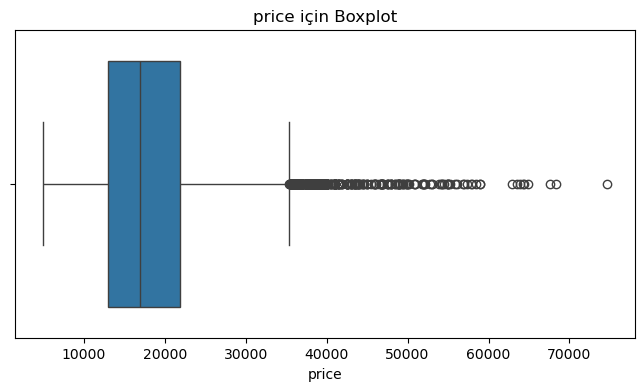

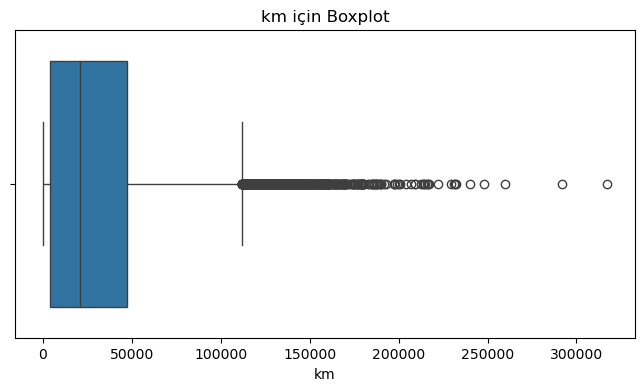

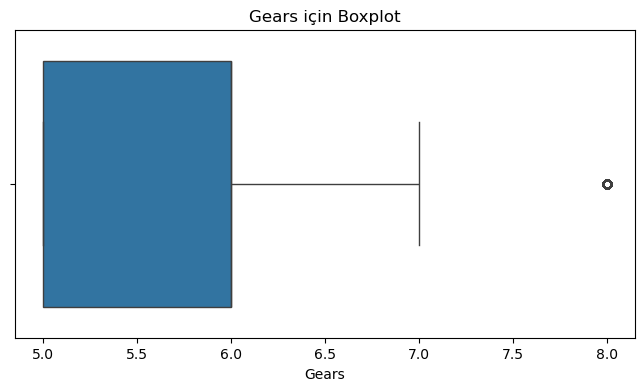

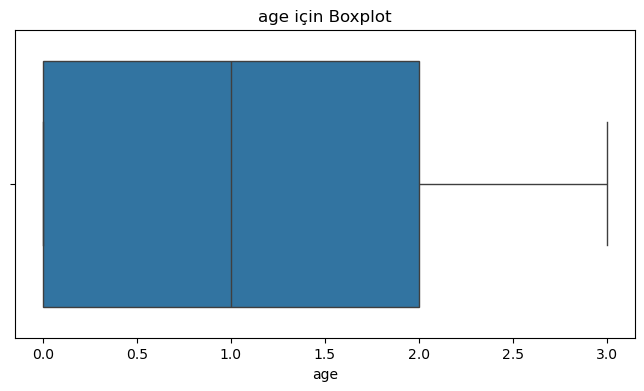

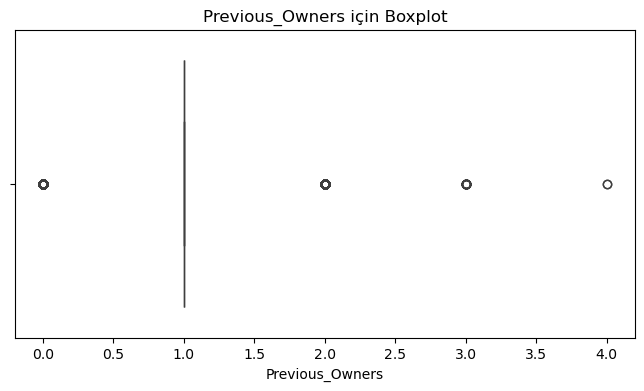

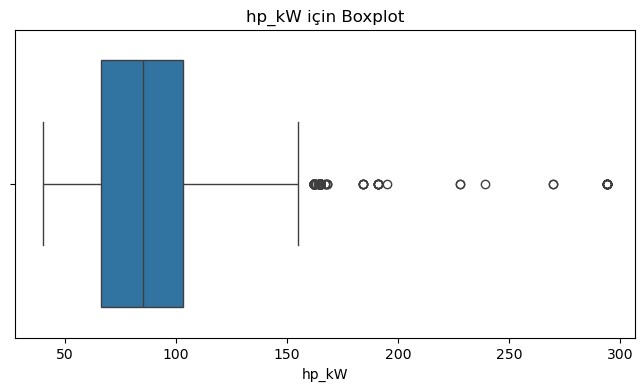

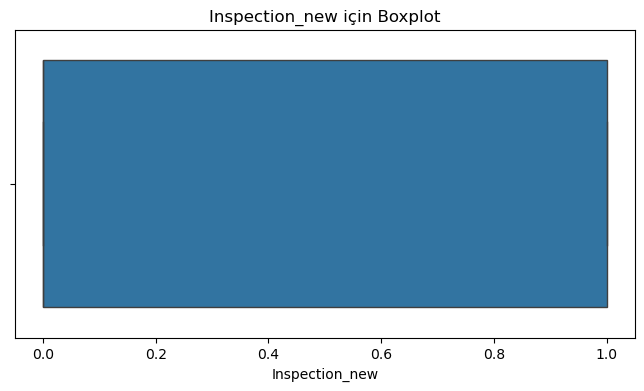

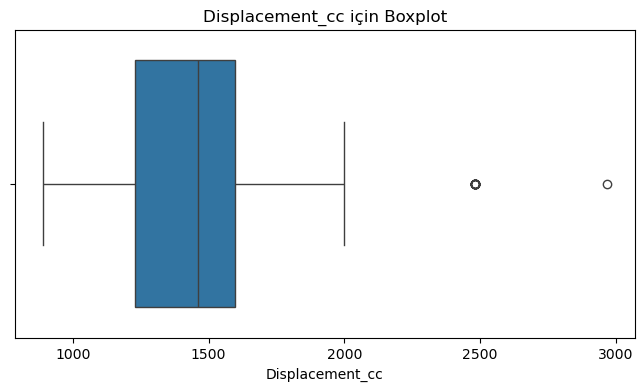

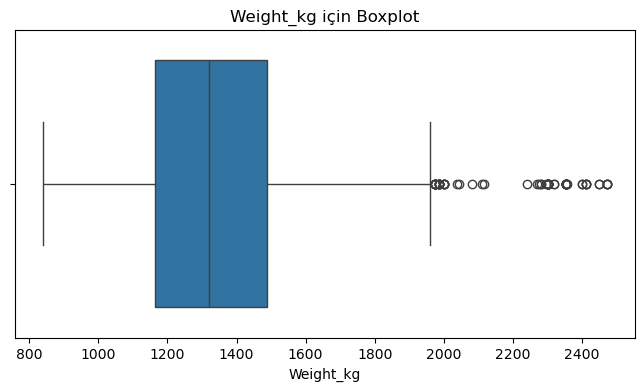

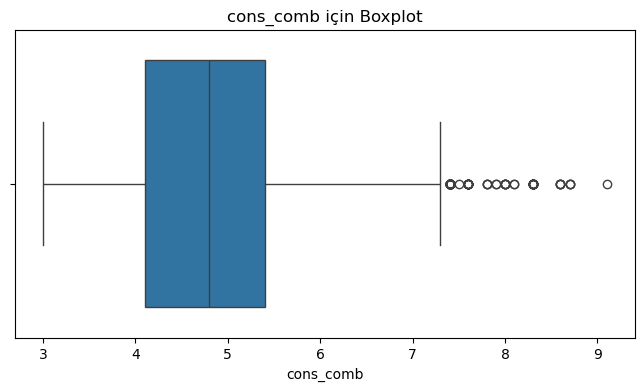

In [71]:
for col in df.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"{col} için Boxplot")
    plt.show()

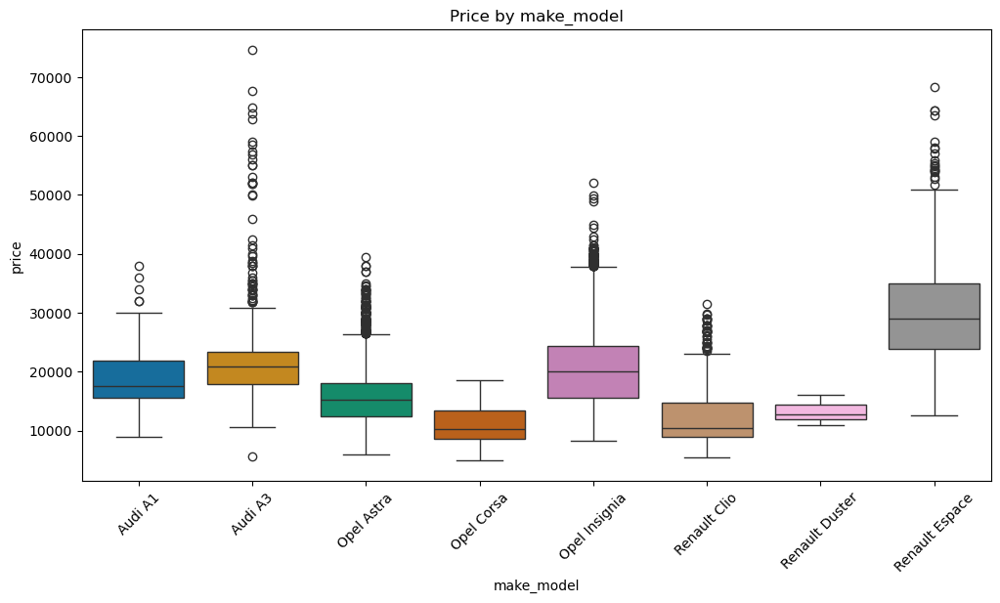

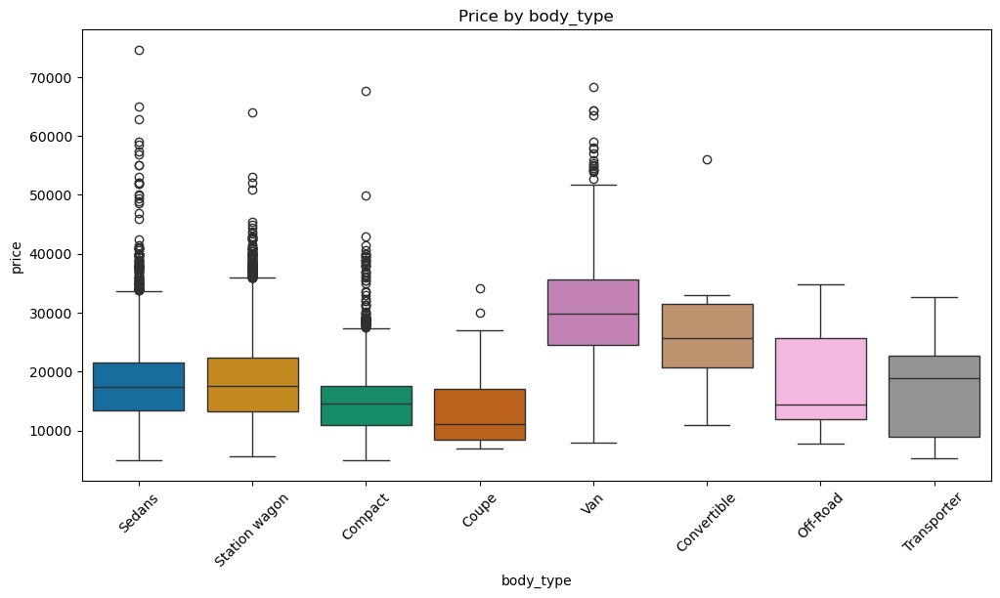

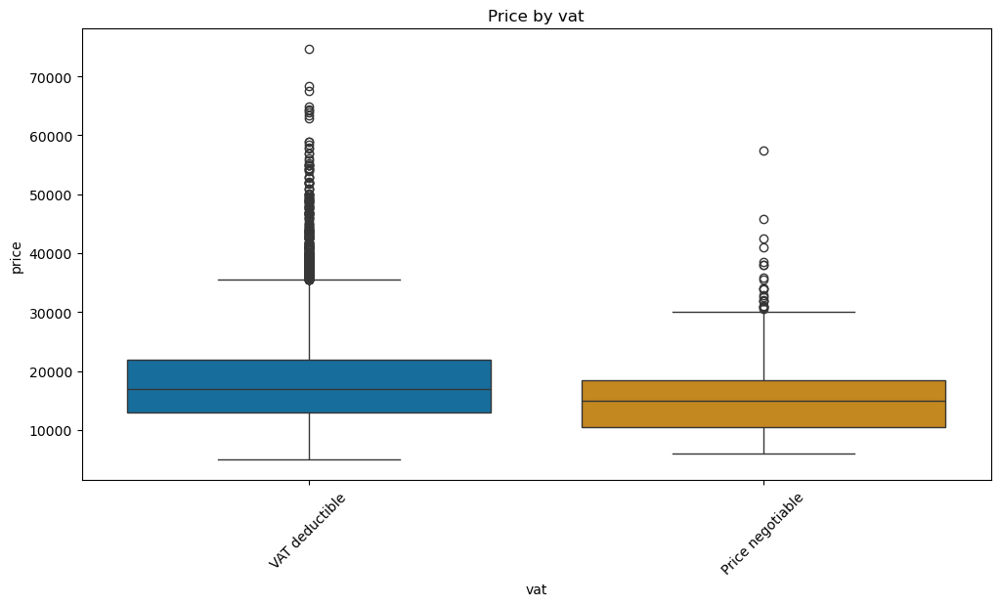

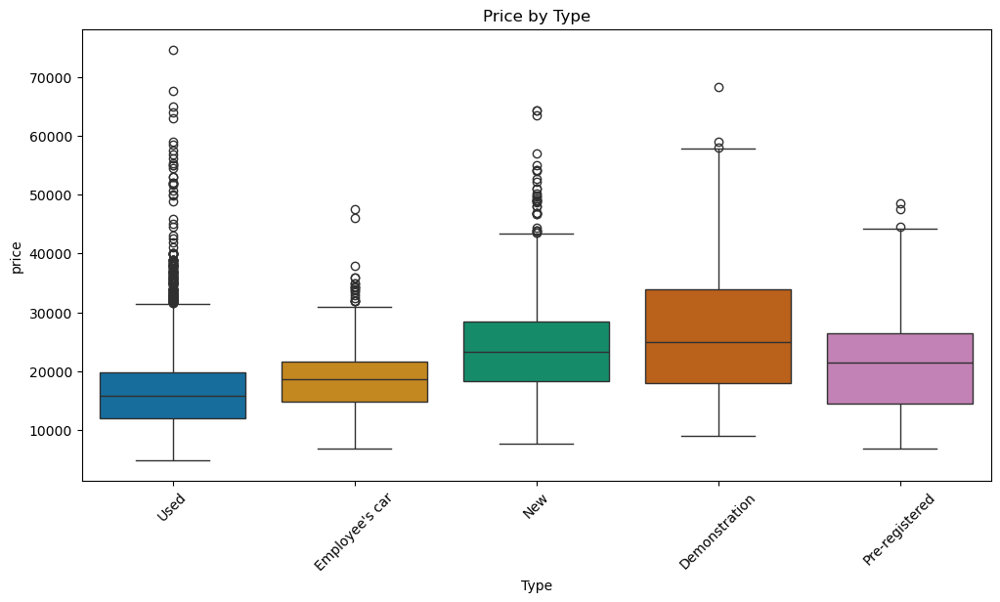

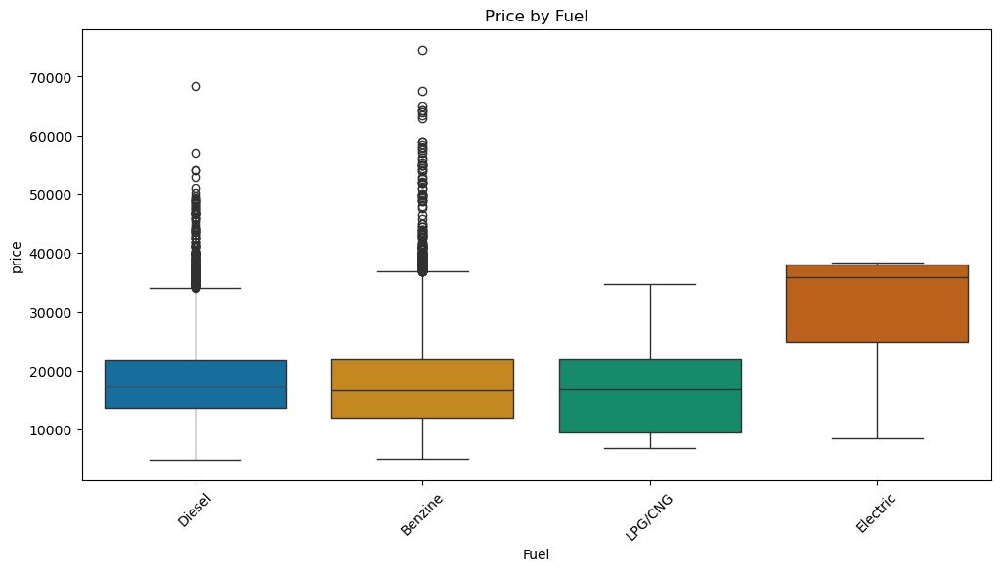

...

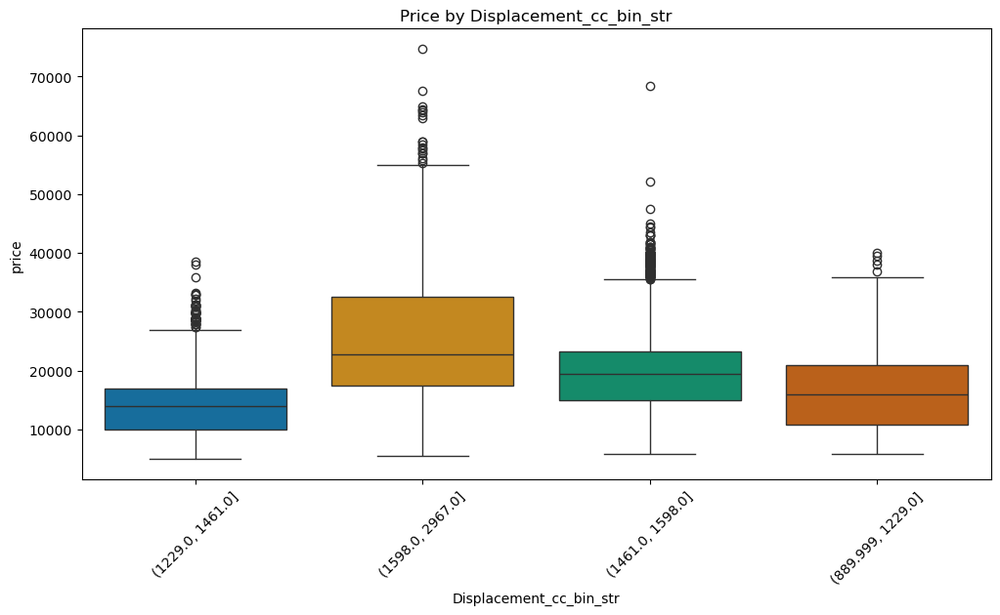

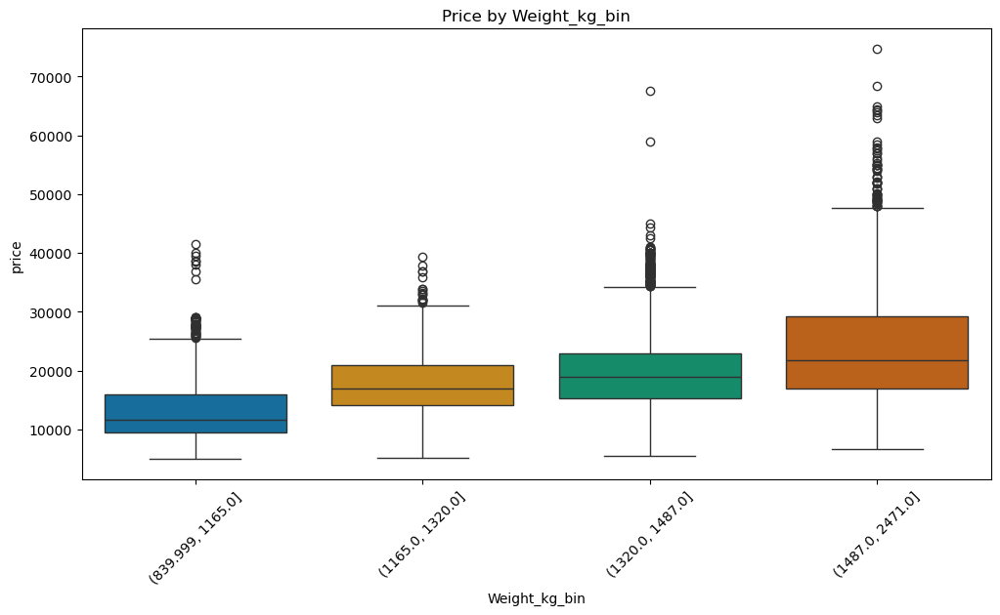

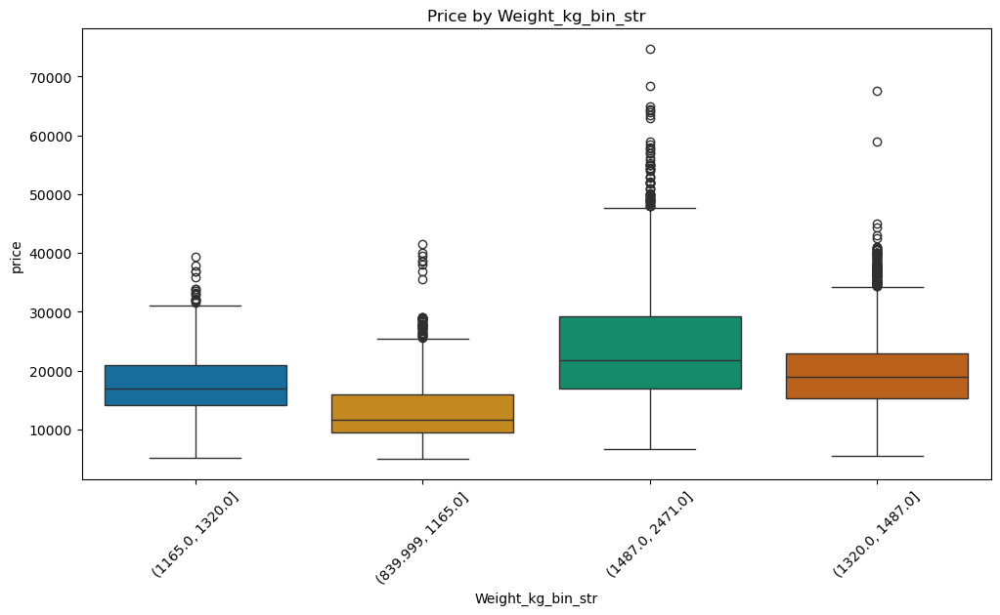

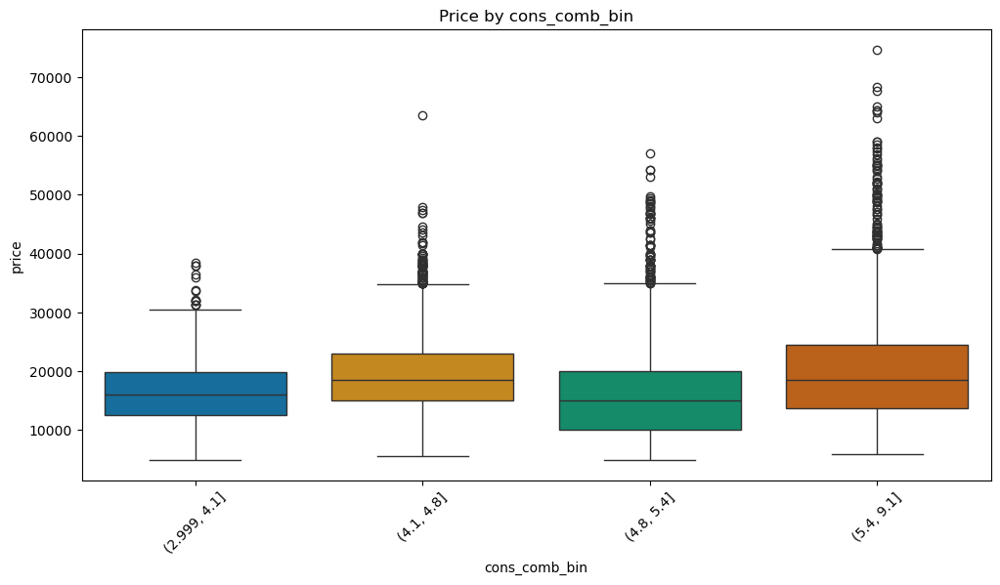

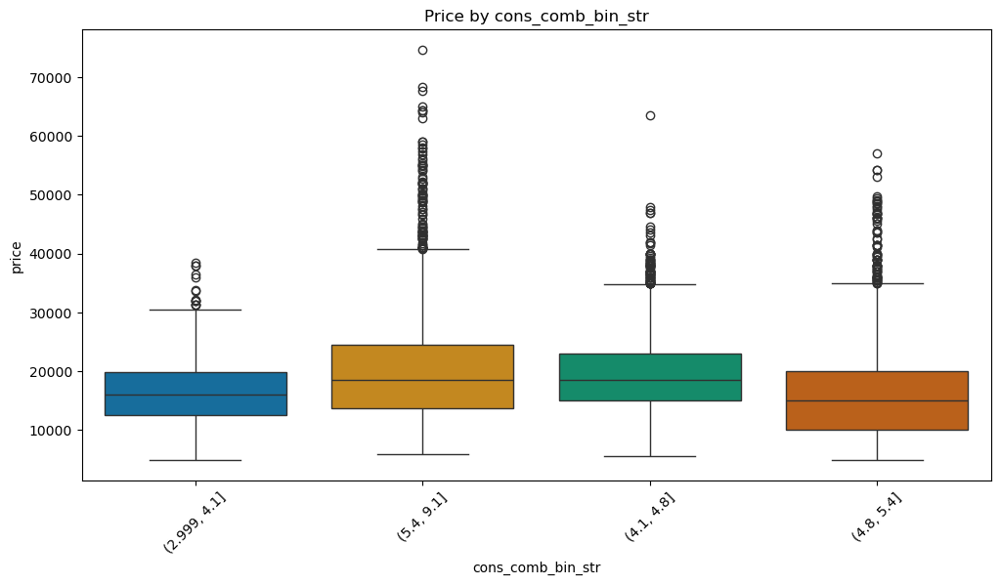

In [72]:
exclude_columns =  df.select_dtypes(include=['number']).columns.tolist()

# Optionally, you might want to limit the number of unique values for categorical plots
max_unique_values = 300

for col in df.columns:
    # Skip over the excluded columns and columns with too many unique values
    if col not in exclude_columns and df[col].nunique() <= max_unique_values:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x=col, y="price", data=df, palette="colorblind")
        
        plt.title(f"Price by {col}")
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.show()

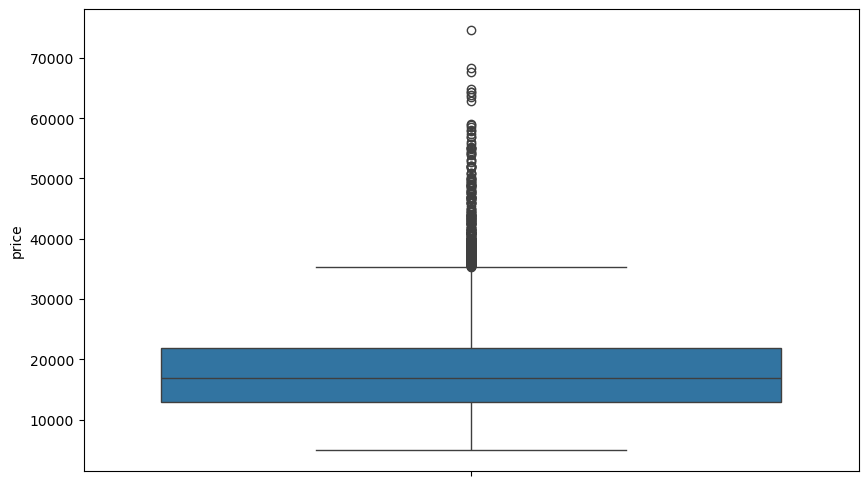

In [73]:
sns.boxplot(df.price);

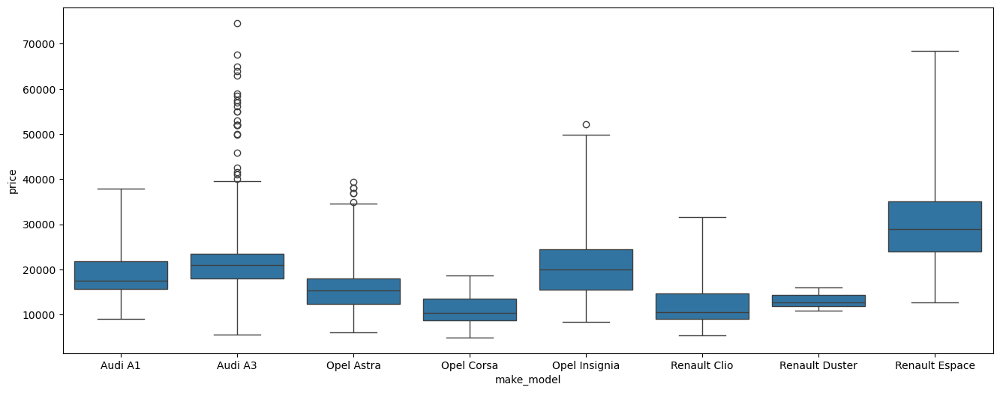

In [74]:
plt.figure(figsize=(16,6))
sns.boxplot(x="make_model", y="price", data=df, whis=3)
plt.show()
# Q1 = df.groupby('make_model')['price'].quantile(0.25)
# Q3 = df.groupby('make_model')['price'].quantile(0.75)
# IQR = Q3-Q1
# lower_lim = Q1-1.5*IQR
# upper_lim = Q3+1.5*IQR

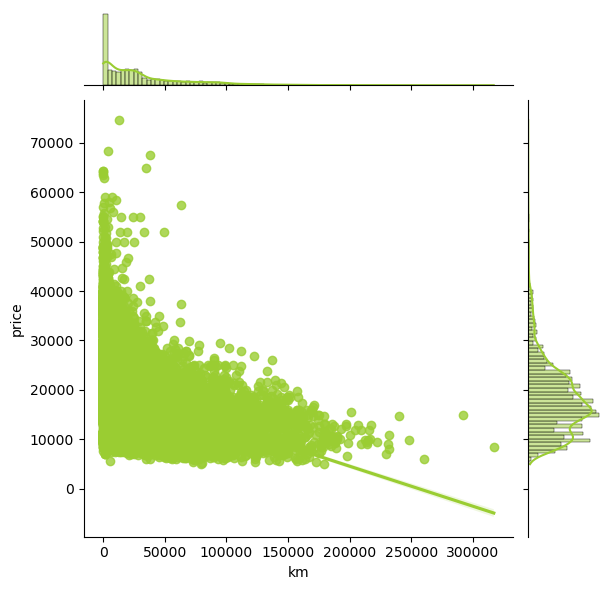

In [75]:
sns.jointplot(y=df["price"], x=df["km"],  kind='reg', color="yellowgreen" );

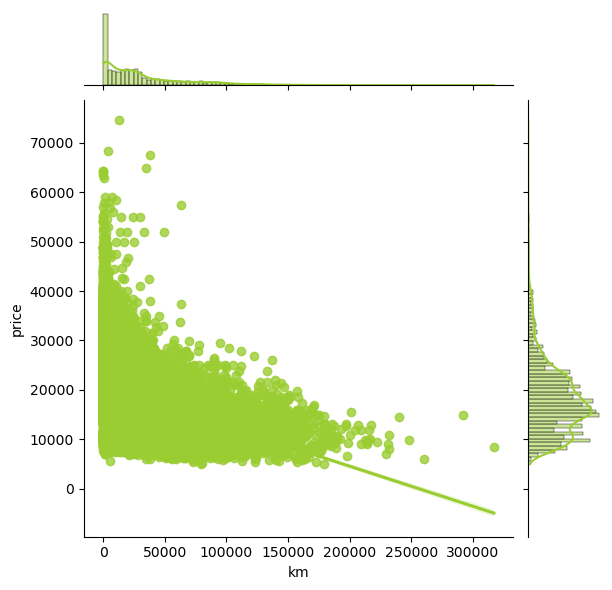

In [76]:
sns.jointplot(y=df["price"], x=df["km"],  kind='reg', color="yellowgreen" );

In [77]:
sns.jointplot(y=df["price"], x=df["gears"], kind='reg', color="violet");

KeyError: 'gears'

In [ ]:
sns.jointplot(y=df["price"], x=df["previous_owners"],  kind='reg', color="orange");

In [ ]:
sns.jointplot(y=df["price"], x=df["age"],  kind='reg', color="darkblue");

In [ ]:
sns.jointplot(y=df["price"], x=df["inspection_new"],  kind='reg',  color="darkred");

In [ ]:
sns.jointplot(y=df["price"], x=df["displacement_cc"],  kind='reg', color="olive");

In [ ]:
sns.jointplot(y=df["price"], x=df["weight_kg"],  kind='reg');

In [ ]:
sns.jointplot(y=df["price"], x=df["cons_comb"],  kind='reg', color="purple");

In [ ]:
#Using Matplotlib for Individual Boxplots
#Seaborn's boxplot function applies the same 'whis' value across all categories, making it less flexible for individual adjustments per category. 
#Therefore, to draw each category separately and tailor the 'whis' value for each, we will utilize Matplotlib's boxplot function.
#This approach allows us to customize outlier detection and presentation for each category based on its specific data distribution,
#providing a more accurate and tailored analysis of outliers across different categories.

whisker_values = {
    'Audi A1': 2.0,
    'Audi A3': 1.5,
    'Opel Astra': 2.0,
    'Opel Corsa': 2.5,
    'Opel Insignia': 3.0,
    'Renault Clio': 2.0,
    'Renault Duster': 1.5,
    'Renault Espace': 3.0
}

plt.figure(figsize=(16,6))

for i, make_model in enumerate(whisker_values.keys()):
    model_data = df[df['make_model'] == make_model]['price']
    plt.boxplot(model_data, positions=[i], whis=whisker_values[make_model], widths=0.5)
    
plt.xticks(range(len(whisker_values)), whisker_values.keys())
plt.show()

In [ ]:
sns.boxplot(x="make_model", y="price", data=df[df["make_model"]== "Audi A1"], whis=1.5)
plt.show()

In [ ]:
#Identifying potential outlier observations for each group based on a whisker value of 1.5.
total_outliers = []

for model in df.make_model.unique():
    
    car_prices = df[df["make_model"]== model]["price"]
    
    Q1 = car_prices.quantile(0.25)
    Q3 = car_prices.quantile(0.75)
    IQR = Q3-Q1
    lower_lim = Q1-1.5*IQR
    upper_lim = Q3+1.5*IQR
    
    count_of_outliers = (car_prices[(car_prices < lower_lim) | (car_prices > upper_lim)]).count()
    
    total_outliers.append(count_of_outliers)
    
    print(f" The count of outlier for {model:<15} : {count_of_outliers:<5}, \
          The rate of outliers : {(count_of_outliers/len(df[df['make_model']== model])).round(3)}")
print()    
print("Total_outliers : ",sum(total_outliers), "The rate of total outliers :", (sum(total_outliers)/len(df)).round(3))

## Get dummies 

In [ ]:
df = df.join(df["Comfort_Convenience"].str.get_dummies(sep = ",").add_prefix("cc_"))
df = df.join(df["Entertainment_Media"].str.get_dummies(sep = ",").add_prefix("em_"))
df = df.join(df["Extras"].str.get_dummies(sep = ",").add_prefix("ex_"))
df = df.join(df["Safety_Security"].str.get_dummies(sep = ",").add_prefix("ss_"))

In [ ]:
df.drop(["Comfort_Convenience","Entertainment_Media","Extras","Safety_Security"], axis=1, inplace=True)

In [ ]:
df = pd.get_dummies(df, drop_first =True)


In [ ]:
bool_columns = df.columns[df.dtypes == 'bool']
df[bool_columns] = df[bool_columns].astype(int)

In [ ]:
df.head()

In [ ]:
df.shape

In [ ]:
df.isnull().any().any()

In [ ]:
corr_by_price = df.corr()["price"].sort_values()[:-1]
corr_by_price


In [ ]:
plt.figure(figsize = (20,10))
sns.barplot(x = corr_by_price.index, y = corr_by_price)
plt.xticks(rotation=90)
plt.tight_layout();

# featureler ile target arasındaki corr.ları görselleştiriyoruz.

 # <font color='lightblack'> <b> Train | Test Split</b><font color='black'> 

**random_state=42**

**test size = 0.2**

In [ ]:
df.head()

In [ ]:
X= df.drop(columns="price")
y= df.price

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modeli eğitip sonrasında prediction almak için datayı train_test_split fonksiyonu ile train ve test setlerine bölüyoruz.
# Default olarak test_size=0.25'tir.
# Best practice 0.2, 0.25, 0.3 civarı değerler tercih edilir. Burdaki amaç train setine
# olabildiğince fazla veri sağlayabilmek. Özellikle küçük datalarda bu oran 0.1, 0.15 civarında seçilebilir

# random_state ile datayı train ve test e random olarak dağıtıyoruz ve 
# her seferinde train ve teste aynı dataları gönderiyoruz

In [ ]:
X_train.shape

In [ ]:
X_test.shape

 # <font color='lightblack'> <b>Implement Linear Regression</b><font color='black'>  

 - Import the modul
 - Fit the model 
 - Predict the test set
 - Determine feature coefficiant
 - Evaluate model performance (use performance metrics for regression and cross_val_score)
 - Compare different evaluation metrics

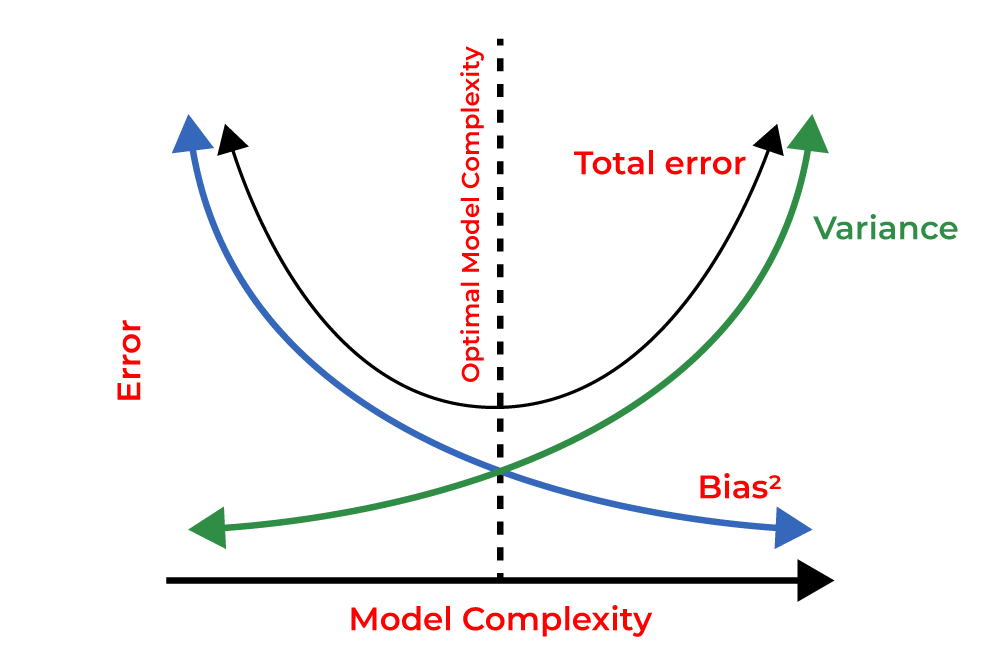

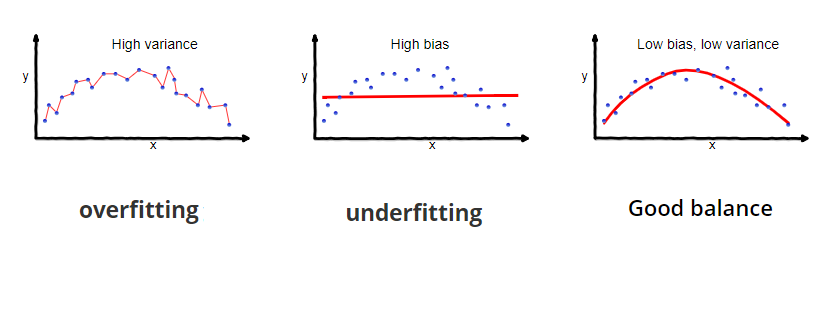

## Model

In [ ]:
def train_val(model, X_train, y_train, X_test, y_test):
    
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    
    scores = {
    "train": {
    "R2" : r2_score(y_train, y_train_pred),
    "mae" : mean_absolute_error(y_train, y_train_pred),
    "mse" : mean_squared_error(y_train, y_train_pred),                          
    "rmse" : np.sqrt(mean_squared_error(y_train, y_train_pred))},
    
    "test": {
    "R2" : r2_score(y_test, y_pred),
    "mae" : mean_absolute_error(y_test, y_pred),
    "mse" : mean_squared_error(y_test, y_pred),
    "rmse" : np.sqrt(mean_squared_error(y_test, y_pred))}
               }
    
    return pd.DataFrame(scores)

In [ ]:
from sklearn.linear_model import LinearRegression 

In [ ]:
lm = LinearRegression() 

In [ ]:
lm.fit(X_train,y_train) 

In [ ]:
train_val(lm, X_train, y_train, X_test, y_test)


## Adjusted R2 Score

In [ ]:
def adj_r2(y_test, y_pred, df):
    r2 = r2_score(y_test, y_pred)       
    n = df.shape[0]                    
    p = df.shape[1]-1               
    adj_r2 = 1 - (1-r2)*(n-1)/(n-p-1)   
    return adj_r2

In [ ]:
y_pred = lm.predict(X_test)

In [ ]:
adj_r2(y_test, y_pred, df)


## Cross Validate

In [ ]:
model = LinearRegression()
scores = cross_validate(model, X_train, y_train, scoring=['r2', 
            'neg_mean_absolute_error','neg_mean_squared_error','neg_root_mean_squared_error'],
             cv =10, return_train_score=True)

In [ ]:
pd.DataFrame(scores)

In [ ]:
pd.DataFrame(scores).iloc[:, 2:].mean()


In [ ]:
train_val(lm, X_train, y_train, X_test, y_test)


In [ ]:
2501/df.price.mean()


## Prediction Error

In [ ]:
# sklearn.__version__
# pip install scikit-learn==1.2.1 --user

from yellowbrick.regressor import PredictionError
from yellowbrick.features import RadViz


In [ ]:
visualizer = RadViz(size=(720, 3000))
model = LinearRegression()
visualizer = PredictionError(model)
visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test) 
visualizer.show();


## Residual Plot

In [ ]:
plt.figure(figsize=(12,8))
residuals = y_test-y_pred

sns.scatterplot(x = y_test, y = -residuals) #-residuals
plt.axhline(y = 0, color ="r", linestyle = "--")
plt.ylabel("residuals")
plt.show()


In [ ]:
from yellowbrick.regressor import ResidualsPlot

visualizer = RadViz(size=(1000, 720))
model = LinearRegression()
visualizer = ResidualsPlot(model)

visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test) 
visualizer.show();        

## Dropping observations from the dataset that worsen my predictions

In [ ]:
df1 = df[~(df.price>35000)]
df1.head() 

In [ ]:
len(df[df.price>35000])

In [ ]:
df0[df0.price>35000].groupby("make_model").count().iloc[:,0]

In [ ]:
df0.make_model.value_counts()

In [ ]:
X = df1.drop(columns = "price")
y = df1.price

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [ ]:
lm2 = LinearRegression()
lm2.fit(X_train,y_train)

In [ ]:
visualizer = RadViz(size=(720, 3000))
model = LinearRegression()
visualizer = PredictionError(model)
visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test)  
visualizer.show();

In [ ]:
train_val(lm2, X_train, y_train, X_test, y_test)

In [ ]:
1894/df1.price.mean()


In [ ]:
2501/df.price.mean()

In [ ]:
y_pred = lm2.predict(X_test)

lm_R2 = r2_score(y_test, y_pred)
lm_mae = mean_absolute_error(y_test, y_pred)
lm_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

In [ ]:
my_dict = { 'Actual': y_test, 'Pred': y_pred, 'Residual': y_test-y_pred }
compare = pd.DataFrame(my_dict)

In [ ]:
comp_sample = compare.sample(20)
comp_sample

In [ ]:
comp_sample.plot(kind='bar',figsize=(15,9))
plt.show()

In [ ]:
pd.DataFrame(lm2.coef_, index = X.columns, columns=["Coef"]).sort_values("Coef")

## Pipeline

In [ ]:
operations = [("scaler", MinMaxScaler()), ("linear", LinearRegression())]


In [ ]:
pipe_model = Pipeline(steps=operations)


In [ ]:
pipe_model.fit(X_train, y_train)

In [ ]:
train_val(pipe_model, X_train, y_train, X_test, y_test)

  # <font color='lightblack'> <b>Implement Ridge Regression</b><font color='black'>  

- Import the modul 
- Do not forget to scale the data or use Normalize parameter as True 
- Fit the model 
- Predict the test set 
- Evaluate model performance (use performance metrics for regression) 
- Tune alpha hiperparameter by using [cross validation](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.RidgeCV.html) and determine the optimal alpha value.
- Fit the model and predict again with the new alpha value. 

## Scaling

In [ ]:
scaler = MinMaxScaler()
scaler.fit(X_train) 

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Model

In [ ]:
from sklearn.linear_model import Ridge

In [ ]:
ridge_model = Ridge(alpha=1, random_state=42) 


In [ ]:
ridge_model.fit(X_train_scaled, y_train)

In [ ]:
train_val(ridge_model, X_train_scaled, y_train, X_test_scaled, y_test)

## Finding best alpha for Ridge

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
alpha_space = np.linspace(0.01, 100, 100)
alpha_space


In [ ]:
ridge_model = Ridge(random_state=42) 

In [ ]:
param_grid = {"alpha":alpha_space}


In [ ]:
ridge_grid_model = GridSearchCV(estimator=ridge_model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs = -1)


In [ ]:
ridge_grid_model.fit(X_train_scaled,y_train)

In [ ]:
ridge_grid_model.best_params_


In [ ]:
ridge_grid_model.best_estimator_


In [ ]:
pd.DataFrame(ridge_grid_model.cv_results_)

In [ ]:
ridge_grid_model.best_index_

In [ ]:
train_val(ridge_grid_model, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
y_pred = ridge_grid_model.predict(X_test_scaled)
rm_R2 = r2_score(y_test, y_pred)
rm_mae = mean_absolute_error(y_test, y_pred)
rm_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

In [ ]:
ridge = Ridge(alpha=1.02, random_state=42).fit(X_train_scaled, y_train)

pd.DataFrame(ridge.coef_, index = X.columns, columns=["Coef"]).sort_values("Coef")


  # <font color='lightblack'> <b>Implement Lasso Regression</b><font color='black'>   

- Import the modul 
- Do not forget to scale the data or use Normalize parameter as True(If needed)
- Fit the model 
- Predict the test set 
- Evaluate model performance (use performance metrics for regression) 
- Tune alpha hyperparameter by using [cross validation](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html) and determine the optimal alpha value.
- Fit the model and predict again with the new alpha value.
- Compare different evaluation metrics

*Note: To understand the importance of the alpha hyperparameter, you can observe the effects of different alpha values on feature coefficants.*

## Model

In [ ]:
from sklearn.linear_model import Lasso

In [ ]:
lasso_model = Lasso(random_state=42, alpha=1)


In [ ]:
lasso_model.fit(X_train_scaled, y_train)

In [ ]:
train_val(lasso_model, X_train_scaled, y_train, X_test_scaled, y_test)

## Finding best alpha for Lasso

In [ ]:
lasso_model = Lasso(random_state=42)

param_grid = {'alpha':alpha_space}

lasso_grid_model = GridSearchCV(estimator=lasso_model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs = -1)

In [ ]:
lasso_grid_model.fit(X_train_scaled,y_train)

In [ ]:
lasso_grid_model.best_params_

In [ ]:
train_val(lasso_grid_model, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
y_pred = lasso_grid_model.predict(X_test_scaled)
lasm_R2 = r2_score(y_test, y_pred)
lasm_mae = mean_absolute_error(y_test, y_pred)
lasm_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

In [ ]:
lasso = Lasso(alpha=1.02, random_state=42).fit(X_train_scaled, y_train)
pd.DataFrame(lasso.coef_, index = X.columns, columns=["Coef"]).sort_values("Coef")

  # <font color='lightblack'> <b> Implement Elastic-Net</b><font color='black'>   

- Import the modul 
- Do not forget to scale the data or use Normalize parameter as True(If needed)
- Fit the model 
- Predict the test set 
- Evaluate model performance (use performance metrics for regression) 
- Tune alpha hyperparameter by using [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) and determine the optimal alpha value.
- Fit the model and predict again with the new alpha value.
- Compare different evaluation metrics

## Model

In [ ]:
from sklearn.linear_model import ElasticNet

In [ ]:
elastic_model = ElasticNet(random_state=42)
elastic_model.fit(X_train_scaled,y_train)

In [ ]:
train_val(elastic_model, X_train_scaled, y_train, X_test_scaled, y_test)

## Finding best alpha and l1_ratio for ElasticNet

In [ ]:
elastic_model = ElasticNet(random_state=42)

In [ ]:
param_grid = {'alpha':[1.02, 2,  3, 4, 5, 7, 10, 11],
              'l1_ratio':[.5, .7, .9, .95, .99, 1]}

elastic_grid_model = GridSearchCV(estimator=elastic_model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs = -1)

In [ ]:
elastic_grid_model.fit(X_train_scaled,y_train)

In [ ]:
elastic_grid_model.best_params_

In [ ]:
train_val(elastic_grid_model, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
y_pred = elastic_grid_model.predict(X_test_scaled)
em_R2 = r2_score(y_test, y_pred)
em_mae = mean_absolute_error(y_test, y_pred)
em_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # <font color='lightblack'> <b> Feature Importance</b><font color='black'> 

In [ ]:
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.features import RadViz

viz = FeatureImportances(Lasso(alpha=1.02), labels=X_train.columns)
visualizer = RadViz(size=(720, 3000))
viz.fit(X_train_scaled, y_train)
viz.show()


In [ ]:
df_new = df0[["make_model", "hp_kW", "km", "age", "Gearing_Type", "price"]]


In [ ]:
df_new.head()

In [ ]:
df_new[df_new["make_model"] == "Audi A2"]

In [ ]:
df_new.drop(index=[2614], inplace=True)

In [ ]:
df_new = df_new[~(df_new.price > 35000)]

In [ ]:
df_new = pd.get_dummies(df_new)
df_new.head()

In [ ]:
len(df_new)

In [ ]:
X = df_new.drop(columns=["price"])
y = df_new.price

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2,
                                                    random_state=42)

In [ ]:
scaler = MinMaxScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
lasso_model = Lasso(random_state=42)

param_grid = {'alpha': alpha_space}

lasso_final_model = GridSearchCV(estimator=lasso_model,
                                 param_grid=param_grid,
                                 scoring='neg_root_mean_squared_error',
                                 cv=10,
                                 n_jobs=-1)

In [ ]:
lasso_final_model.fit(X_train_scaled, y_train)

In [ ]:
lasso_final_model.best_params_

In [ ]:
lasso_final_model.best_score_

In [ ]:
train_val(lasso_final_model, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
2132 / df_new.price.mean()

In [ ]:
y_pred = lasso_final_model.predict(X_test_scaled)
fm_R2 = r2_score(y_test, y_pred)
fm_mae = mean_absolute_error(y_test, y_pred)
fm_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # <font color='lightblack'> <b> Compare Models Performance</b><font color='black'> 

In [ ]:
scores = {
    "linear_m": {
        "r2_score": lm_R2,
        "mae": lm_mae,
        "rmse": lm_rmse
    },
    "ridge_m": {
        "r2_score": rm_R2,
        "mae": rm_mae,
        "rmse": rm_rmse
    },
    "lasso_m": {
        "r2_score": lasm_R2,
        "mae": lasm_mae,
        "rmse": lasm_rmse
    },
    "elastic_m": {
        "r2_score": em_R2,
        "mae": em_mae,
        "rmse": em_rmse
    },
    "final_m": {
        "r2_score": fm_R2,
        "mae": fm_mae,
        "rmse": fm_rmse
    }
}
scores = pd.DataFrame(scores).T
scores

In [ ]:
#metrics = scores.columns

for i, j in enumerate(scores):
    plt.figure(i)
    if j == "r2_score":
        ascending = False 
    else:
        ascending = True 
    compare = scores.sort_values(by=j, ascending=ascending)
    ax = sns.barplot(x = compare[j] , y= compare.index)
    for p in ax.patches:
            width = p.get_width()                     
            ax.text(width,                               
                    p.get_y() + p.get_height() / 2,     
                    '{:.4f}'.format(width),             
                    ha = 'left',                        
                    va = 'center') 

  # <font color='lightblack'> <b> Prediction</b><font color='black'>

## Prediction with new observation

In [ ]:

final_scaler = MinMaxScaler()
final_scaler.fit(X)
X_scaled = final_scaler.transform(X)

In [ ]:
lasso_model = Lasso()

param_grid = {'alpha': alpha_space}

final_model = GridSearchCV(estimator=lasso_model,
                           param_grid=param_grid,
                           scoring='neg_root_mean_squared_error',
                           cv=10,
                           n_jobs=-1)

In [ ]:
final_model.fit(X_scaled, y)

In [ ]:
final_model.best_estimator_

In [ ]:
my_dict = {
    "hp_kW": 66,
    "age": 2,
    "km": 17000,
    "make_model": 'Audi A3',
    "Gearing_Type": "Automatic"
}

In [ ]:
my_dict = pd.DataFrame([my_dict])
my_dict

In [ ]:
my_dict = pd.get_dummies(my_dict)
my_dict

In [ ]:
X.head(1)

In [ ]:
my_dict = my_dict.reindex(columns=X.columns, fill_value=0)
my_dict

In [ ]:
my_dict = final_scaler.transform(my_dict)
my_dict

In [ ]:
final_model.predict(my_dict)

## Prediction with random samples

In [ ]:
final_scaler = MinMaxScaler()
final_scaler.fit(X)
X_scaled = final_scaler.transform(X)

In [ ]:
lasso_model = Lasso()

param_grid = {'alpha': alpha_space}

final_model = GridSearchCV(estimator=lasso_model,
                           param_grid=param_grid,
                           scoring='neg_root_mean_squared_error',
                           cv=10,
                           n_jobs=-1)

In [ ]:
final_model.fit(X_scaled, y)

In [ ]:
final_model.best_estimator_

In [ ]:
random_samples = df_new.sample(n=20)

In [ ]:
X_random = random_samples.drop(columns=["price"])

In [ ]:
X_random = final_scaler.transform(X_random)

In [ ]:
predictions = final_model.predict(X_random)
predictions

In [ ]:
true_labels = random_samples["price"].values
true_labels

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(range(len(true_labels)), true_labels, color='blue', label='Gerçek Değerler')
plt.scatter(range(len(predictions)), predictions, color='red', label='Tahminler', alpha=0.5)
plt.title('Comparison of Model Predictions and Actual Prices')
plt.xlabel('Samples')
plt.ylabel('Price')
plt.legend()
plt.show()


In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(true_labels, predictions, color='darkorange', label='Tahminler')
plt.plot([min(true_labels), max(true_labels)], [min(true_labels), max(true_labels)], 'k--', lw=2, label='İdeal')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Comparison of Actual and Predicted Prices')
plt.legend()
plt.show()